In [1]:
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import re
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats.stats import pearsonr,spearmanr

ModuleNotFoundError: No module named 'seaborn'

In [2]:
counts=pd.read_csv("counts_table.txt", index_col=0)
counts.head()

,1_1,1_2,2_1,2_2,3_1,3_2,4_1,4_2,5_1,5_2,...,IAI67_2,B367_1,B367_2,DAEC9_1,DAEC9_2,SB_42_1,SB_42_2,SB5521_1,SB5521_2,MFDpir
AAAAAAAAAAAAATATCAAC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAAAAAAAAAAACAGGTAAA,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAAAAAAAAAATCATTAAAA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAAAAAAAAACAAATTTTGT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAAAAAAAAACGAGACTCGC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


In [ ]:
counts.shape

(803091, 46)

In [ ]:
#remove reads with N
good_indexes=[i for i in counts.index if "N" not in i]
counts=counts.loc[good_indexes]

counts=counts.fillna(0)

In [ ]:
counts.shape

(787903, 46)

Lots of sequences might be sequencing errors as a bottleneck was applied to select only ~40-50k clones during the library cloning. Let's see what is the distribution of read counts

In [ ]:
counts_tot=counts.sum(axis=1)
counts_tot.max()

1292041.0

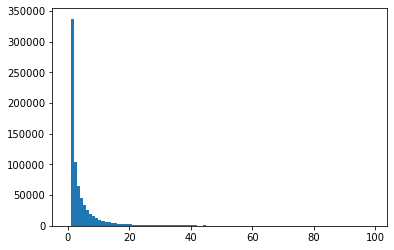

In [ ]:
plt.hist(counts_tot.values,bins=range(100))
plt.show()

In [ ]:
(counts_tot<=1).sum(),(counts_tot<=10).sum(),(counts_tot<20).sum(),(counts_tot>=50).sum(),(counts_tot>=100).sum(),(counts_tot>=200).sum()

(337626, 668020, 709637, 51977, 40391, 29692)

It is somewhat surprising to have so many sequences with more than 1 or 2 reads. Either the same sequencing mistakes can happen at a relatively high frequency or the the initial library is larger than we think. It might be interesting to look at the hamming distance between sequences with high read counts and sequences with low read counts (to do).

We will for now only consider sequences with more than 50 reads in the initial library. 

In [ ]:
## Data filtering
counts=counts[counts['MFDpir']>20]
counts.shape

(27862, 46)

In [ ]:
counts.sum()

1_1            2962392.0
1_2            2844893.0
2_1            4964234.0
2_2            7720242.0
3_1            6032810.0
3_2            5632645.0
4_1            6634644.0
4_2            4347328.0
5_1            5284487.0
5_2            6382581.0
6_1            4840613.0
6_2            6462025.0
7_1            5068793.0
7_2            5529660.0
8_1            6509905.0
8_2            3255098.0
9_1            5529378.0
9_2            2422737.0
10_1            361574.0
10_2           2898264.0
11_1           3621441.0
11_2           3957995.0
12_1           3253494.0
12_2           3170894.0
phagemid      10897516.0
B156_1         3816576.0
B156_2         4384555.0
ATCC8739_1     5328909.0
ATCC8739_2     5250992.0
B921_1         1033453.0
B921_2          703343.0
55989_1        2338569.0
55989_2        8316204.0
H223_1         3610523.0
H223_2         2690219.0
IAI67_1        4759806.0
IAI67_2        2882207.0
B367_1         3986062.0
B367_2         5714309.0
DAEC9_1        4440787.0


In [ ]:
##Normalization without pooling
norm_factors=np.mean(counts.mean())/counts.mean()
norm_data=counts*norm_factors
norm_data.head()

,1_1,1_2,2_1,2_2,3_1,3_2,4_1,4_2,5_1,5_2,...,IAI67_2,B367_1,B367_2,DAEC9_1,DAEC9_2,SB_42_1,SB_42_2,SB5521_1,SB5521_2,MFDpir
AAAAAAAACGAGACTCGCCT,35.075283,33.203594,23.785309,46.494728,49.322143,30.186388,20.644359,18.469177,25.918878,45.879258,...,27.857670,16.588420,11.571385,38.288080,48.087667,9.911122,3.604984,12.356433,28.083187,26.576382
AAAAAAGTAAGGCTGCCGGT,491.053965,458.209593,608.903908,524.901007,559.767173,558.448181,568.787688,551.902468,479.946119,567.570822,...,458.832207,485.803724,540.548989,655.151593,441.204341,326.359105,371.313338,628.118658,460.252237,595.595700
AAAAAAGTATATGCCTGTCG,0.000000,0.000000,8.562711,11.011909,3.914456,22.639791,0.711874,16.296333,0.000000,0.000000,...,9.832119,8.294210,4.959165,20.207598,15.628492,2.123812,4.806645,1.372937,7.020797,18.508552
AAAAAAGTTGAGTTCGATAA,0.000000,0.000000,10.465536,0.611773,0.000000,0.000000,4.271247,1.086422,0.000000,0.000000,...,16.386865,7.109323,9.091803,7.444904,27.650408,0.000000,15.621597,2.745874,2.340266,11.389878
AAAAAAGTTTTACCCCGTTG,0.000000,1.660180,9.514124,9.176591,9.394694,0.000000,27.763104,14.123488,5.362526,10.359832,...,14.748178,15.403533,10.744858,29.779618,27.650408,1.415875,21.629903,6.178216,3.900443,23.254334


1 (0.8751587831445469, 0.0)


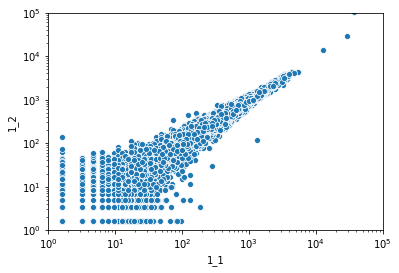

10 (0.9584667586309042, 0.0)


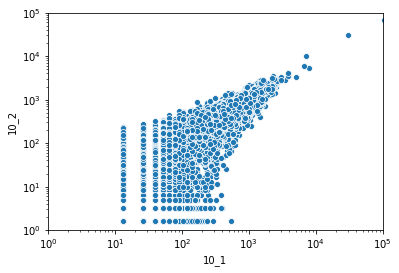

11 (0.8999227042198813, 0.0)


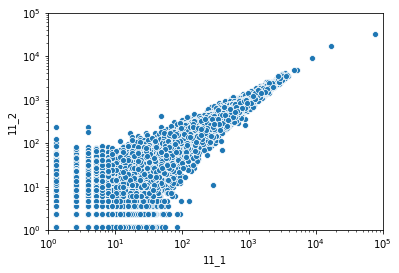

12 (0.9630584757052947, 0.0)


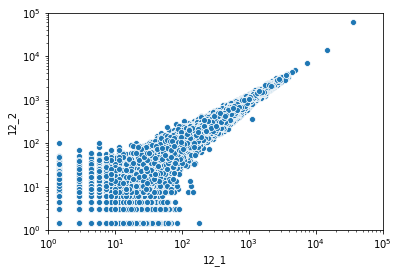

2 (0.7373711835808621, 0.0)


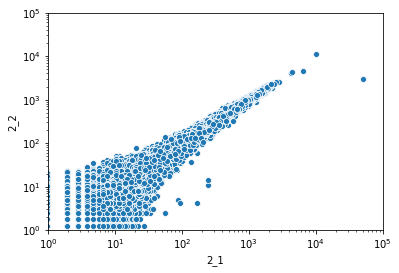

3 (0.8537002871578498, 0.0)


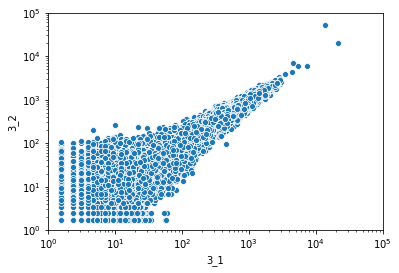

4 (0.9146416702026826, 0.0)


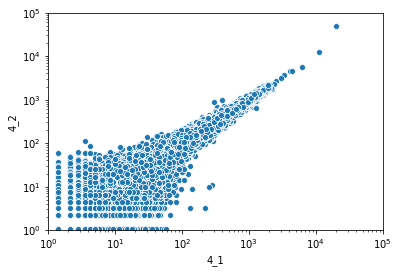

5 (0.9459875646655693, 0.0)


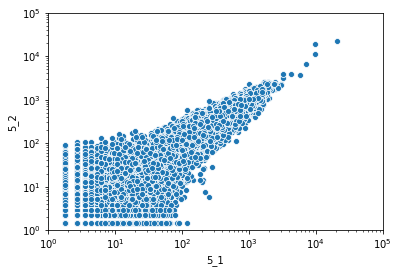

55989 (0.6309395220498085, 0.0)


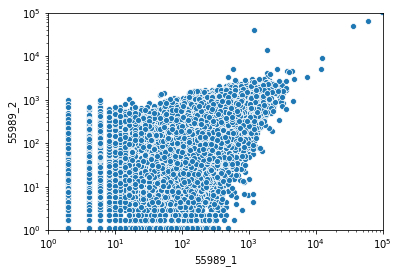

6 (0.9797140088543975, 0.0)


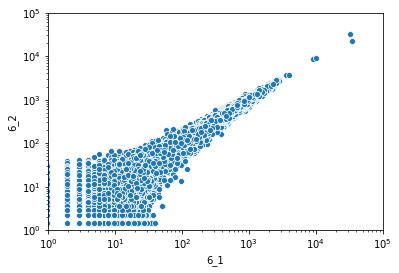

7 (0.9778533866084967, 0.0)


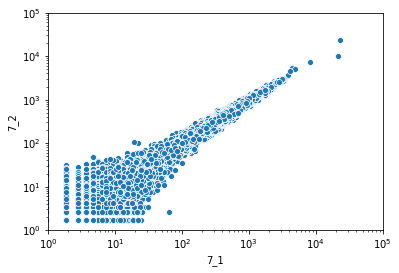

8 (0.7910163104349435, 0.0)


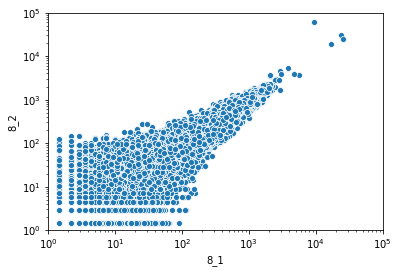

9 (0.7041864493461562, 0.0)


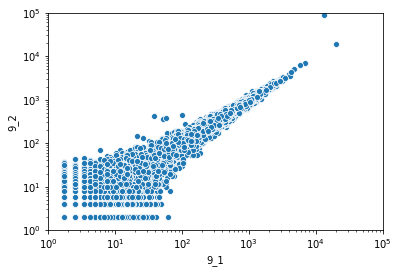

ATCC8739 (0.9961870227247143, 0.0)


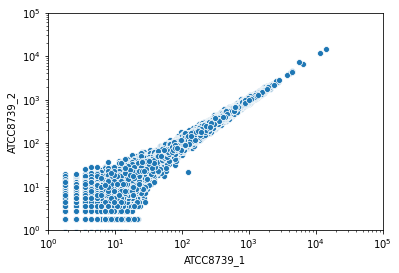

B156 (0.9067058474252768, 0.0)


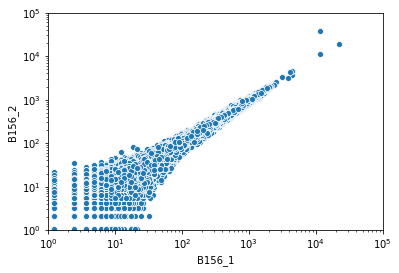

B367 (0.9957139435875886, 0.0)


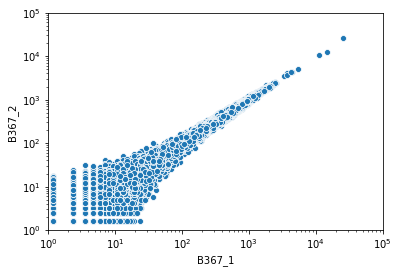

B921 (0.9976151436692902, 0.0)


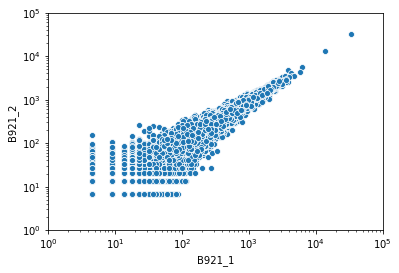

DAEC9 (0.9539996773563255, 0.0)


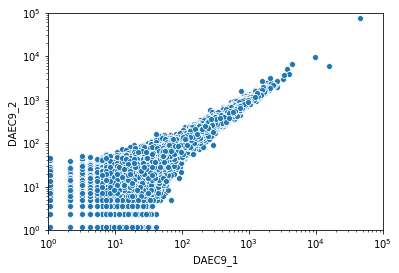

H223 (0.9085375802544893, 0.0)


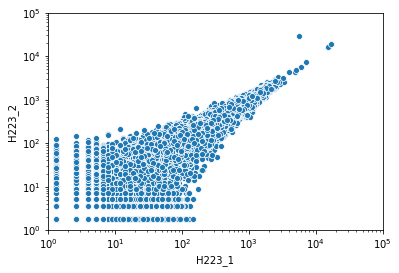

IAI67 (0.9819590300871054, 0.0)


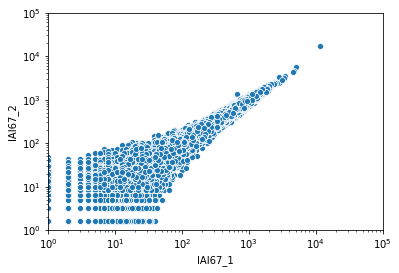

SB5521 (0.9688142839783206, 0.0)


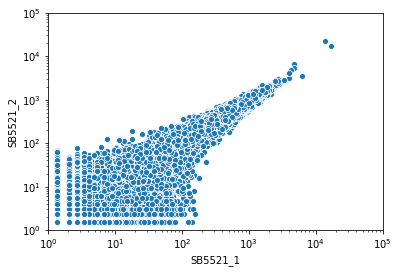

SB_42 (0.8680787733961296, 0.0)


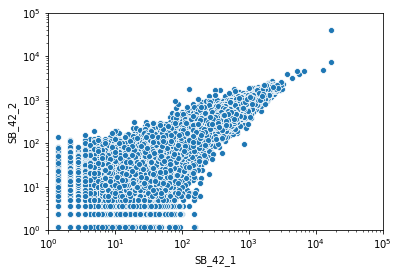

In [ ]:
#Let's look at the correlation between experimental replicates
strains=np.unique([x[:-2] for x in norm_data.columns if x not in ["phagemid", "MFDpir"]])
for s in strains:
    #fig = plt.subplots(1,1)
    ax=sns.scatterplot(s+"_1",s+"_2",data=norm_data)
    ax.loglog()
    plt.xlim([1,100000])
    plt.ylim([1,100000])
    print(s,pearsonr(norm_data[s+"_1"],norm_data[s+"_2"]))
    plt.show()

Correlation between replicates is generally ok with the exception of maybe strain 55989.

## Computing log2FC

Two controls were sequenced, the library in the MFDpir strain (the donor for conjugation) or in the phagemid production strain. We expect them to be highly correlated. 

(0.9313627635988715, 0.0)

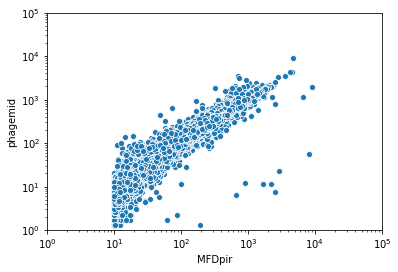

In [ ]:
ax=sns.scatterplot('MFDpir','phagemid',data=norm_data)
ax.loglog()
plt.xlim([1,100000])
plt.ylim([1,100000])
pearsonr(norm_data.phagemid,norm_data.MFDpir)

There are a few depleted sequences in the phagemid production strains. Maybe a restriction system is still present in that strain? We will use the MFDpir strain as a control to compute the log2FC.

In [ ]:
log2FC=pd.DataFrame(index=norm_data.index)

for sample in norm_data.columns:
    if sample not in ['MFDpir']:
        log2FC.loc[:,sample]=np.log2((1+norm_data.loc[:,sample])/(1+norm_data.loc[:,'MFDpir']))
        
samples=log2FC.columns

In [ ]:
log2FC.loc[log2FC.phagemid<-4, "phagemid"]

ATAATACATAGCGATTTATG   -4.708885
ATTCGGATGAATTTTAGGCA   -6.422677
CATTTTAAACTTTGTAACTC   -7.111310
CCAGAAGTATTACCCAAATT   -6.399285
CCCAGCTCGGTTAGTTGGTT   -7.045281
CTTTTGCTTTTTATTTTGTA   -8.227027
GTATTAGTCGTTATTACGGT   -6.490421
GTATTTGTAAGACCGACGGA   -4.530350
GTGTTAGGAGGGTATATGCT   -7.462347
TATTCCGTTAGTAGCTATAG   -6.083633
TCCCGGATCGTTTGGACATC   -4.785992
TGACATTTTGACATGCAGTA   -6.931443
TGTAAGAAAGGTGCCCATAT   -4.760317
TTAGCAAGGATTAATGACTT   -5.234641
TTTGCAATGGTATGGTGAGG   -8.430462
Name: phagemid, dtype: float64

It is not straight forward to identify a pattern just looking at the sequences. We'll come back to this latter.

Let's now look at the distribution fo log2FC in each strain

1_1 -2.193542644249716


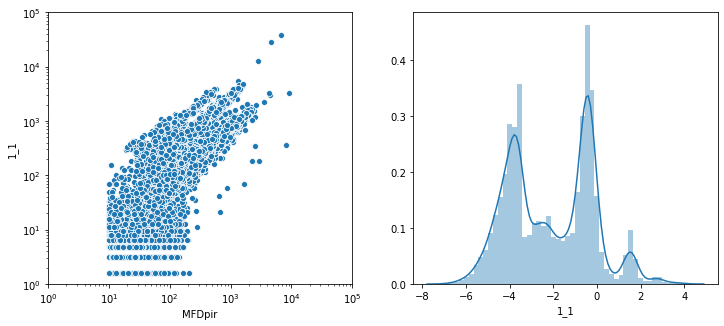

1_2 -2.163219635297921


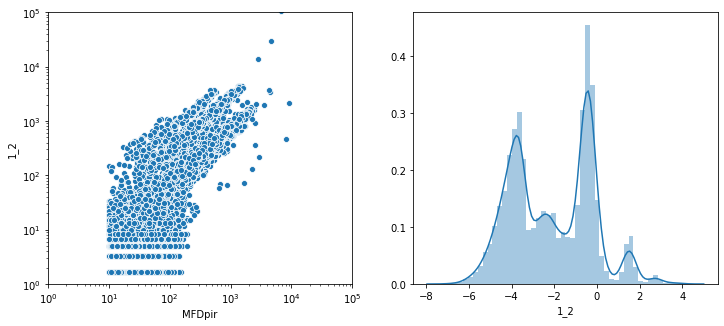

2_1 -0.6670223796113465


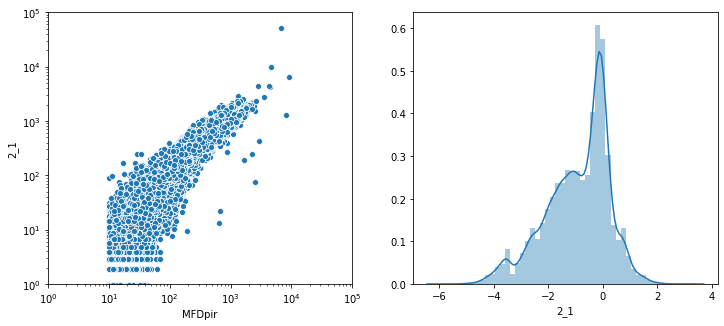

2_2 -0.7996733982812316


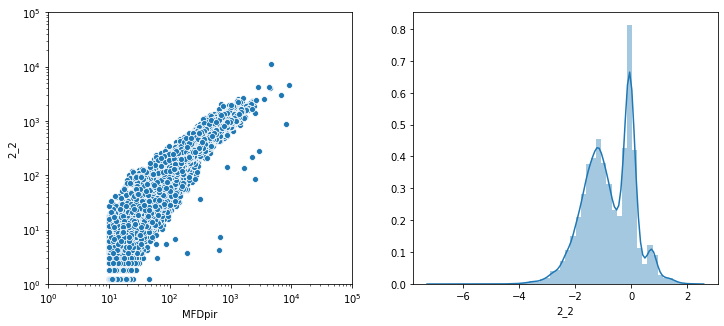

3_1 -1.6325082131853652


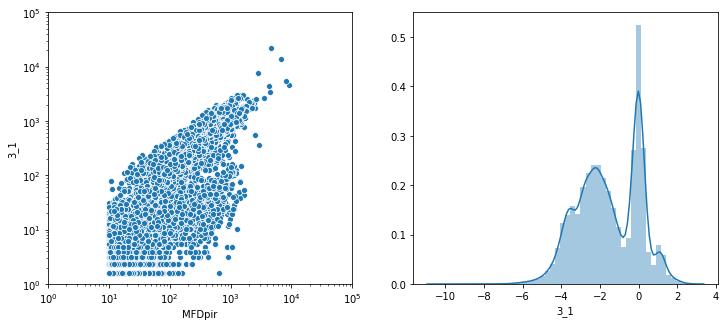

3_2 -1.5818370740502141


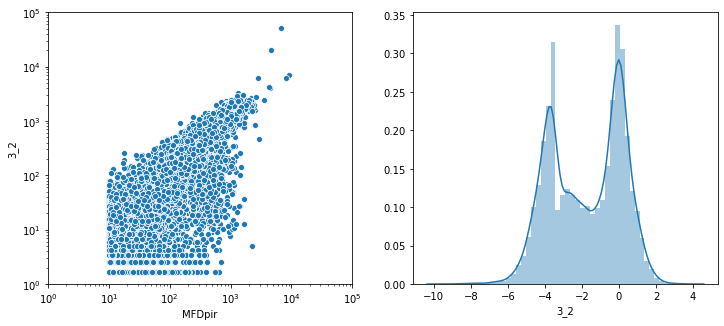

4_1 -0.5290629433934797


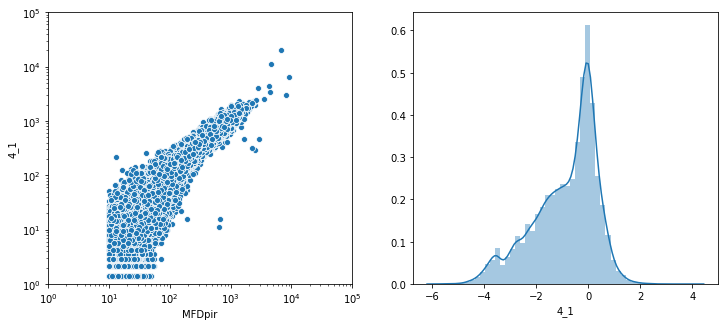

4_2 -0.6755783015823256


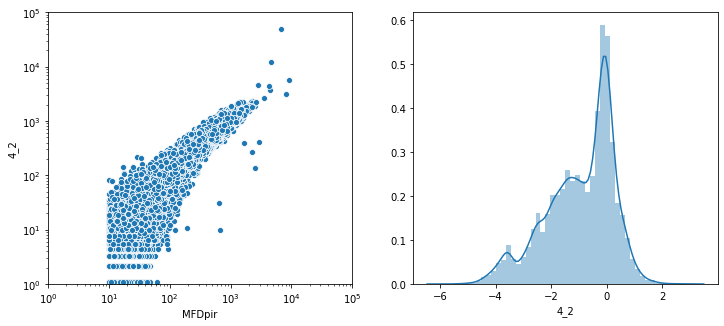

5_1 -0.6687194176650428


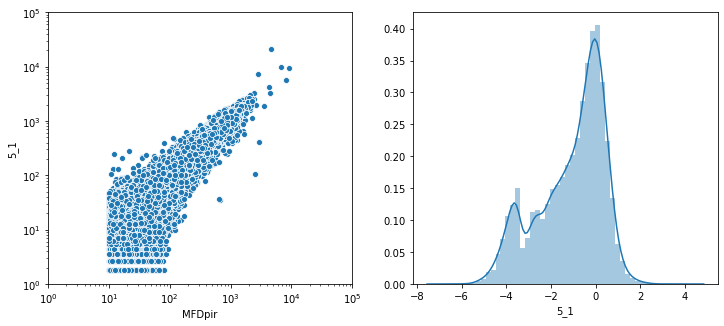

5_2 -0.7000354427243112


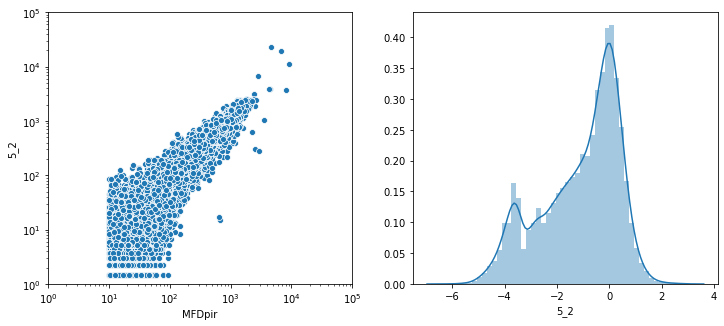

6_1 -1.2228575933537549


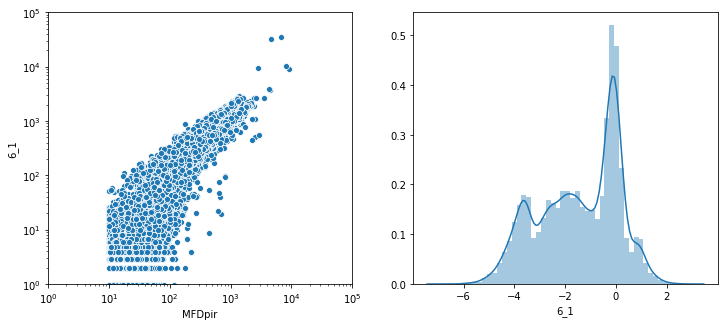

6_2 -1.2241076475825456


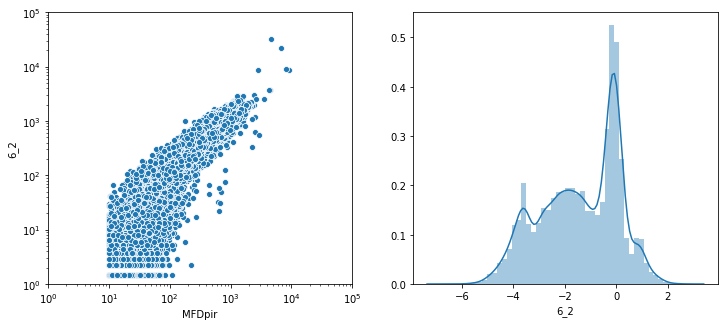

7_1 -1.623841045719891


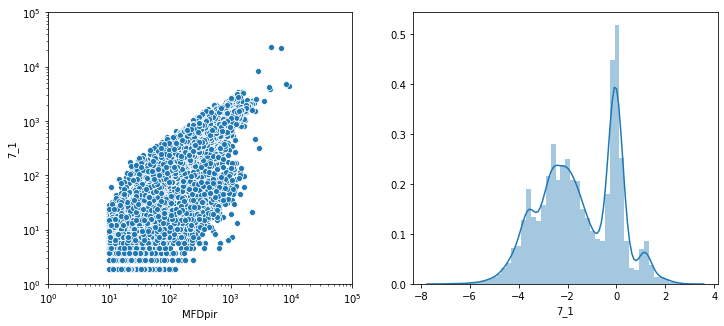

7_2 -1.485914262737158


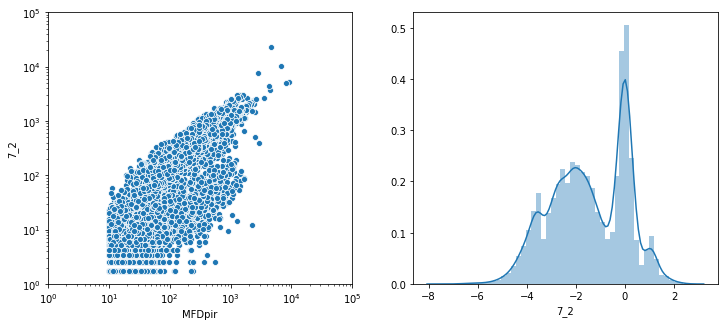

8_1 -0.23138028505303193


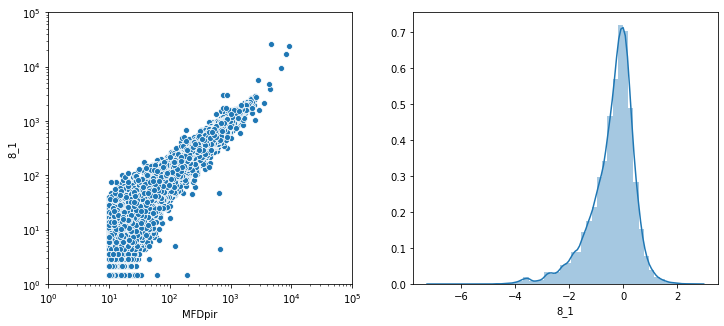

8_2 -0.2888498820982007


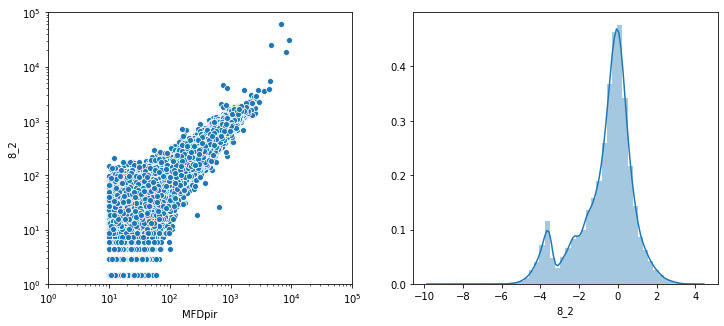

9_1 -1.339545519511463


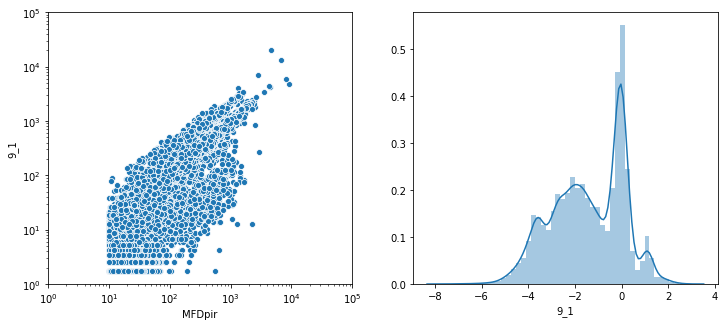

9_2 -1.283245150718211


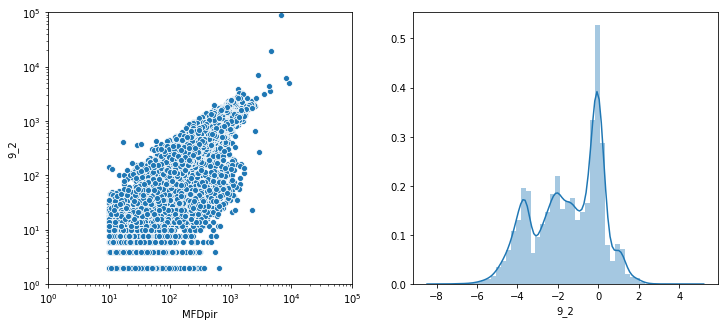

10_1 -2.4535944583689124


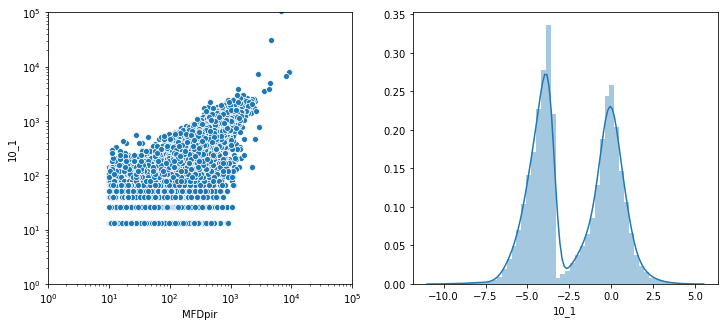

10_2 -1.4720876329663728


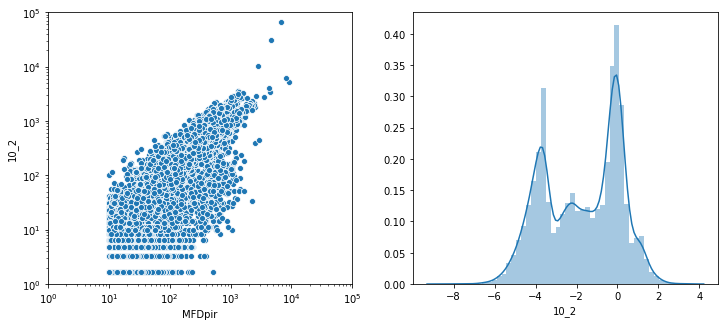

11_1 -1.7233950524849344


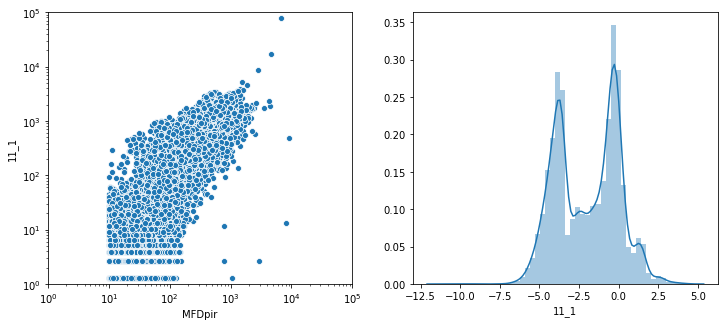

11_2 -1.814914749134836


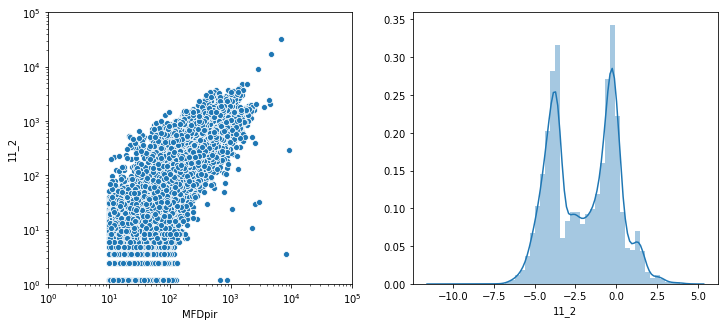

12_1 -1.6668997179053209


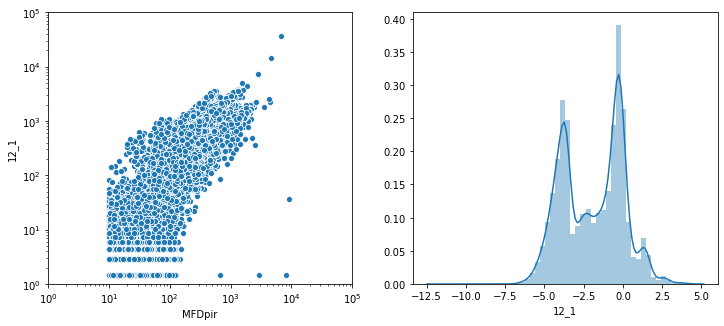

12_2 -1.6072683020540157


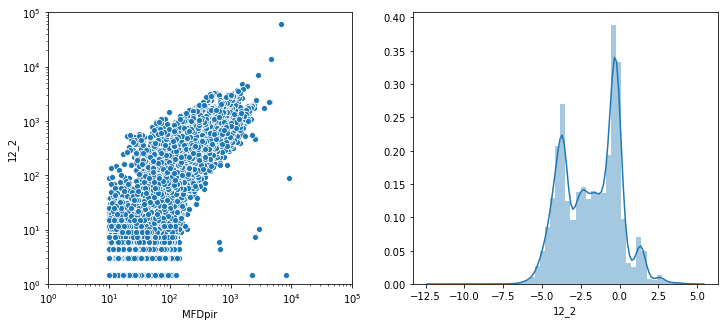

phagemid -0.13939595718204412


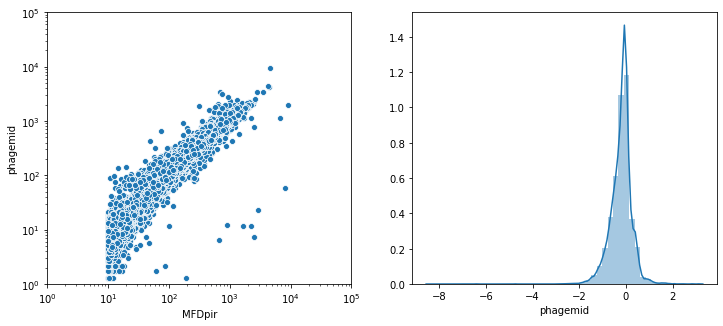

B156_1 -0.19561261949431435


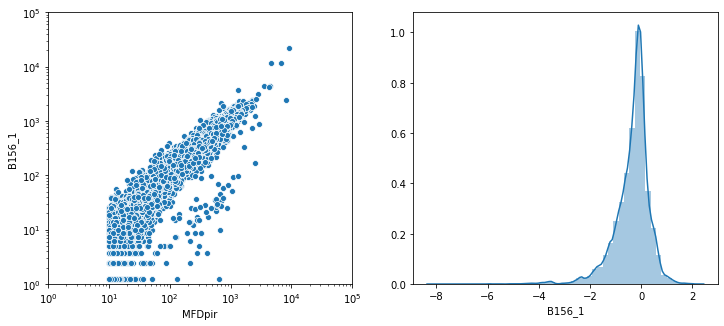

B156_2 -0.18930987249290276


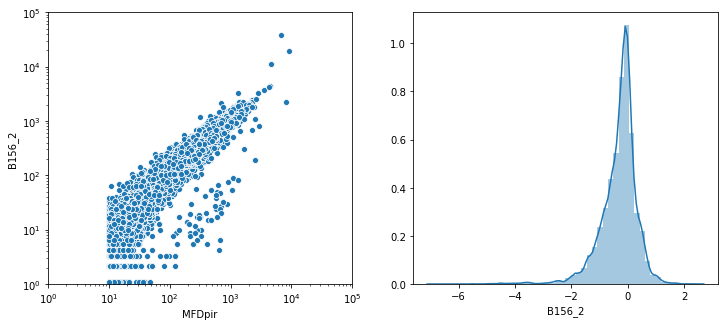

ATCC8739_1 -0.767707464894209


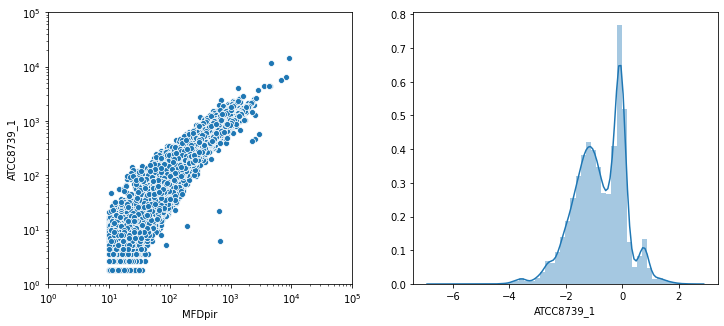

ATCC8739_2 -0.7190169783632339


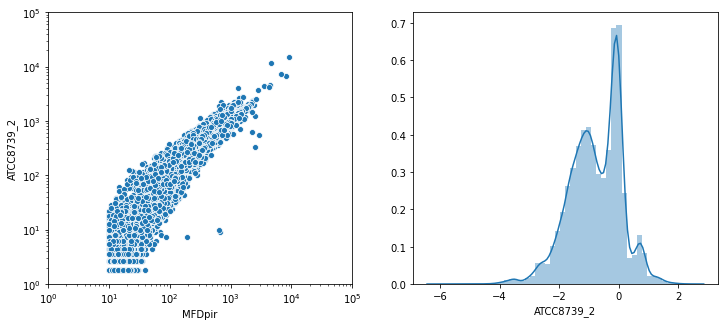

B921_1 -1.973920206776548


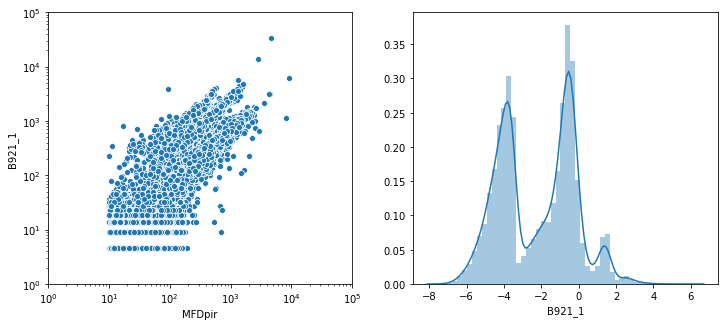

B921_2 -1.7616945768343077


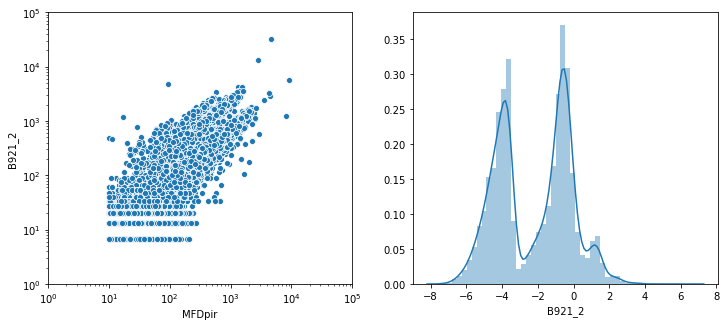

55989_1 -3.5161061249371177


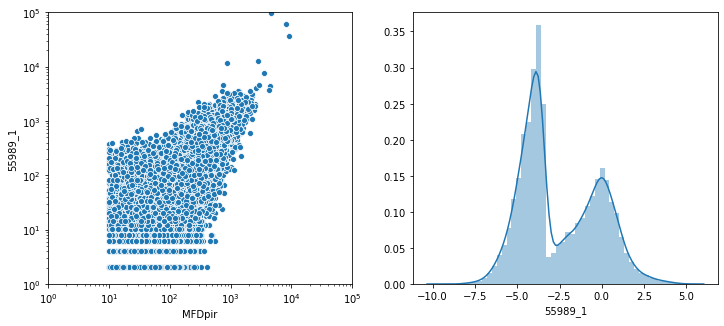

55989_2 -2.893204727612526


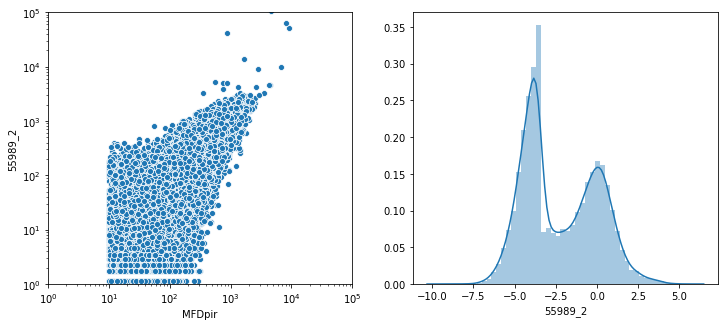

H223_1 -1.1829420562520718


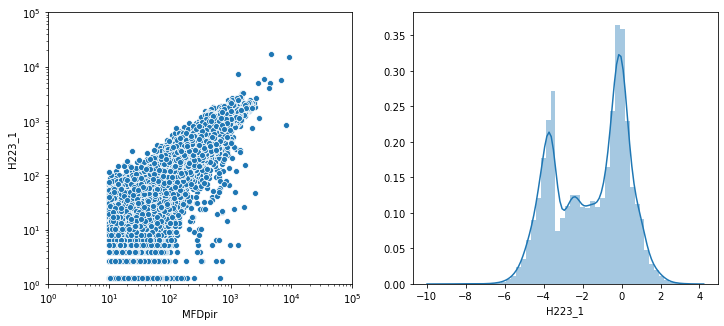

H223_2 -1.1886745212917866


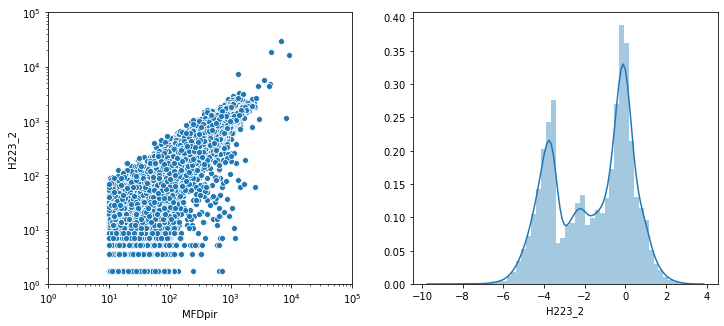

IAI67_1 0.024802719407116917


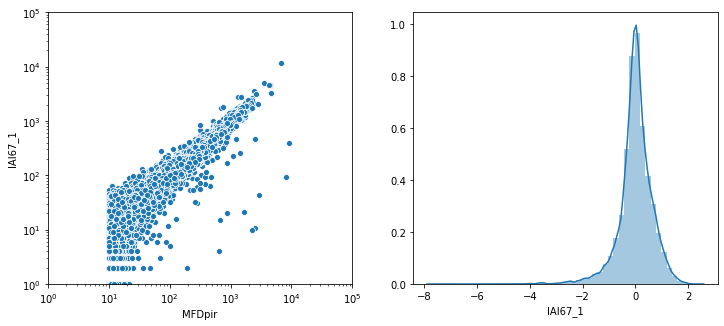

IAI67_2 0.06342874157619072


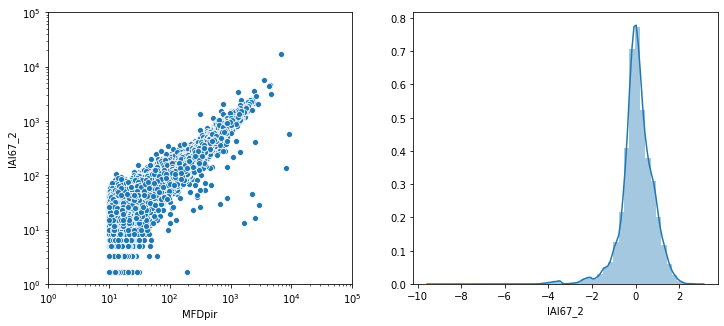

B367_1 -0.2501001234898768


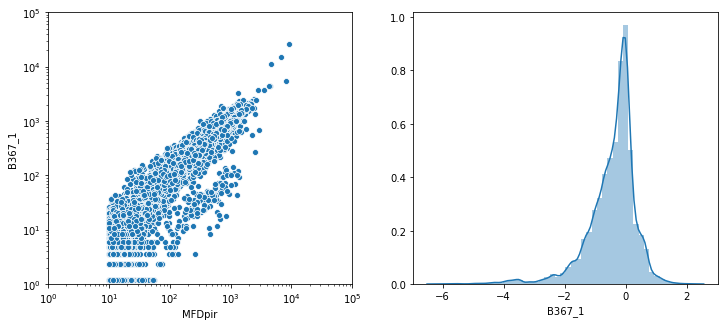

B367_2 -0.27278317062548796


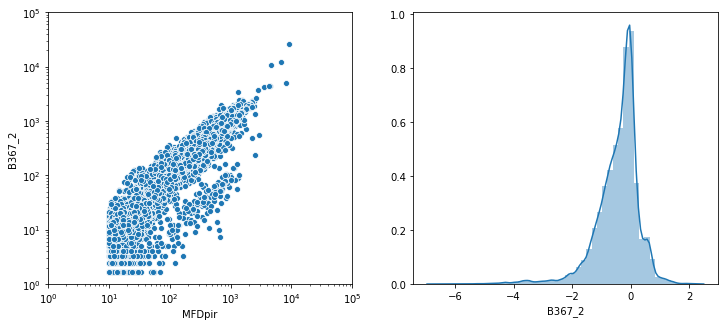

DAEC9_1 0.026380931711894016


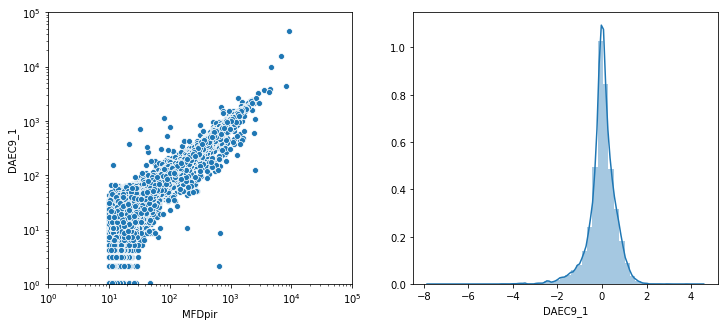

DAEC9_2 0.008538845654034894


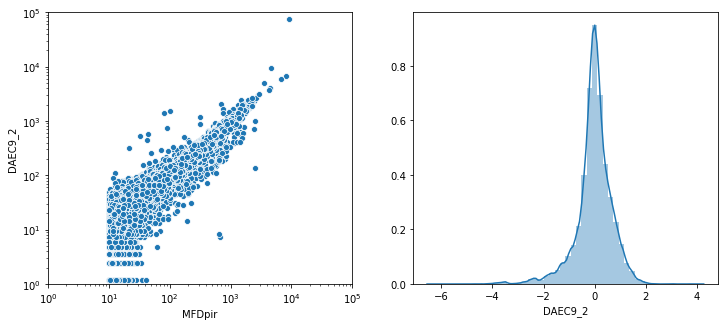

SB_42_1 -1.1705651366561665


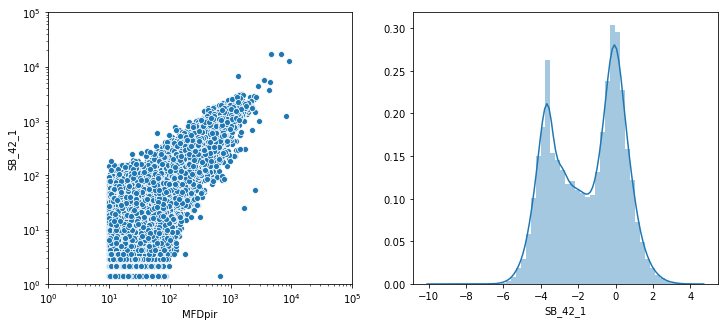

SB_42_2 -0.41664365565152184


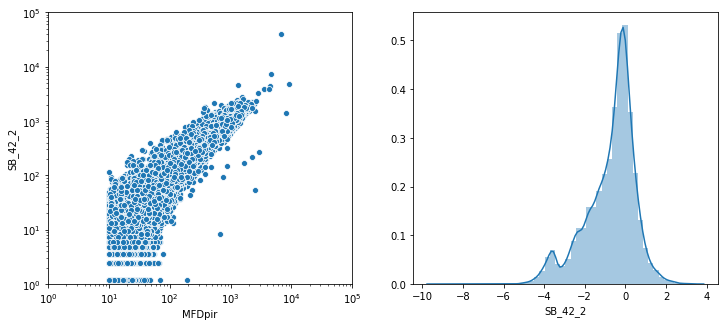

SB5521_1 -1.1235409444443358


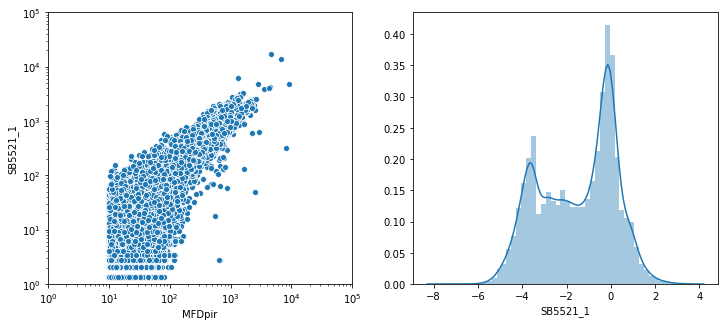

SB5521_2 -1.0094222862916005


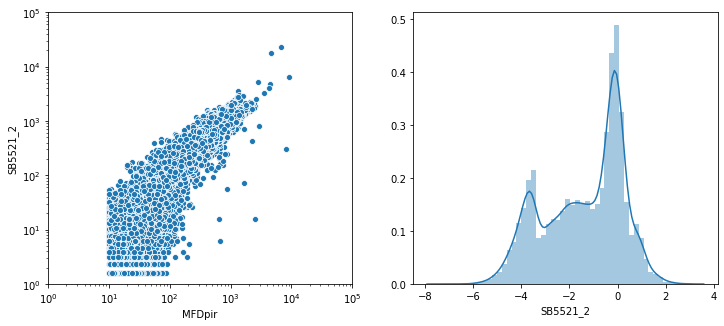

In [ ]:
#Plotting a few more comparisions
for sample in norm_data.columns:
    if sample!="MFDpir":
        print(sample,np.median(log2FC[sample]))
        fig, (ax1,ax2)= plt.subplots(1,2,figsize=(12,5))
        sns.scatterplot('MFDpir',sample,data=norm_data,ax=ax1)
        ax1.loglog()
        ax1.set_xlim([1,100000])
        ax1.set_ylim([1,100000])

        sns.distplot(log2FC[sample],ax=ax2)
        plt.show()

In [ ]:
from collections import Counter, defaultdict
import re
from random import choice
from itertools import groupby
bases=list("ATGC")

def revcomp(seq:str):
    trns=str.maketrans("ATGCN","TACGN")
    return seq.translate(trns)[::-1]

def allseqs(n,seqs=[""]):
    seqs=[s+b for s in seqs for b in bases]
    if len(seqs[0])<n:
        return allseqs(n,seqs)
    else:
        return seqs
     
def lib2site_sets(lib,pattern=(3,6,4),no_ori=True):
    '''Computes the list of unique sites matching the pattern present in each sequence of the library
    The pattern is a list of 3 number:
        1. The number of defined bases in the first part of the site
        2. The number of undefined bases in the middle
        3. The number of defined bases in the second part of the site
    '''
    #Checks all sequences are the same size
    if len(set([len(s) for s in lib]))!=1:
        return 'not all seqeunces in library are the same size'
    
    L=len(lib[0])
    
    if len(pattern)>L:
        return 'site specifications are longer than the sequence provided'
    
    
    set_list=[]
    for seq in lib:
        sites=re.findall("(?=([ATGC]{{{}}})([ATGC]{{{}}})([ATGC]{{{}}}))".format(pattern[0],pattern[1],pattern[2]),seq)
        if no_ori==True:
            rev=revcomp(seq)
            sites+=re.findall("(?=([ATGC]{{{}}})([ATGC]{{{}}})([ATGC]{{{}}}))".format(pattern[0],pattern[1],pattern[2]),rev)
        set_list.append(set([s1+'N'*pattern[1]+s3 for s1,s2,s3 in sites]))

    return set_list

def get_FC_lists_old(set_list,FCs):
    #For each site, computes a list of log2FC for all the seqs that carry the site
    site_FCs=defaultdict(list)
    for i,seq_set in enumerate(set_list):
        for seq in seq_set:
            site_FCs[seq].append(FCs[i])
    return site_FCs

flatten = lambda l: [item for sublist in l for item in sublist]

def get_FC_lists(set_list,FCs):
    #For each site, computes a list of log2FC for all the seqs that carry the site
    #this implementation is much faster
    l=[[(s,l[1]) for s in l[0]] for l in zip(set_list,FCs)]
    l=flatten(l)
    return dict([(key,[i[1] for i in it]) for key, it in groupby(sorted(l), key=itemgetter(0))])

from itertools import groupby
from operator import itemgetter
#samples=["A","B"]
#set_list=[["ATCG","GCTC"],["ATAT","ATCG"]]
#FCs=[[0,-2],[1,-3]]
def get_site_FCs(set_list,FCs):
    flatten = lambda l: [item for sublist in l for item in sublist]
    l=[[(s,l[1]) for s in l[0]] for l in zip(set_list,FCs)]
    l=flatten(l)
    d=dict([(key,[i[1] for i in it]) for key, it in groupby(sorted(l), key=itemgetter(0))])
    return dict([(samples[i],dict([(k,[f[i] for f in d[k]]) for k in d])) for i in range(len(samples))])

In [ ]:
#tests
def test_lib2site_sets():
    assert lib2site_sets(["ATCG","CCGG",'GACC','TCCA'],pattern=(2,0,0))==[{'AT', 'CG', 'GA', 'TC'},
                                                                             {'CC', 'CG', 'GG'},
                                                                             {'AC', 'CC', 'GA', 'GG', 'GT', 'TC'},
                                                                             {'CA', 'CC', 'GA', 'GG', 'TC', 'TG'}]
    
test_lib2site_sets()
            
def test_get_FC_lists():
    d=get_FC_lists([['ATNG', 'CGNT'], ['ATNG', 'ACNC']],[0,-2])
    assert sorted(d['ATNG'])==sorted([0, -2])
    assert sorted(d['CGNT'])==sorted([0])
    assert sorted(d['ACNC'])==sorted([-2])

test_get_FC_lists()

In [ ]:
left, right = "gtgctaggtataatactagt", "atccactagtccctttacgc"
def get_lib_seq_context(seqs,left,right):
    left=left.upper()
    right=right.upper()
    lib=[left+r+right for r in seqs]
    return lib
 
def get_site_FCs(log2FC,sample,pattern=(6,0,0),no_ori=True):
    lib=get_lib_seq_context(list(log2FC.index),"gtgctaggtataatactagt", "atccactagtccctttacgc")
    print("Finding all possible sites with this pattern in the library...")
    set_list=lib2site_sets(lib,pattern=pattern,no_ori=no_ori)
    FCs=log2FC[sample]
    print("Getting the FCs of guides that contain each site...")
    site_FCs=get_FC_lists(set_list,FCs)
    
    return site_FCs

def get_all_sites(pattern):
    #generates a list of all sites that match the pattern
    return [s[:pattern[0]]+"N"*pattern[1]+s[pattern[0]:] for s in allseqs(pattern[0]+pattern[2])]

def find_sites(site_FCs,pattern,thr=-1,p=0.9):
    print("generating list of all sites that match the pattern...")
    allsites=get_all_sites(pattern)
    print("checking if each site matches the selection criteria...")
    for site in allsites:
        if site in site_FCs:
            s=sum([(x-np.median(FCs))<thr for x in site_FCs[site]])/len(site_FCs[site])
            #t=score(site_FCs[site],np.median(FCs),4)
            if s>p:
                if len(site_FCs[site])<10:
                    #{:.1e}".format(t), 
                    print(site, s, len(site_FCs[site]), 
                          "[",", ".join(["{:.1f}".format(v) for v in site_FCs[site]]),"]")
                else:
                    print(site, s, len(site_FCs[site]))

        else:
            print(site,"is not covered by the library")
                


In [ ]:
sample="3_1"
pattern=(6,0,0)
thr=-1

lib=get_lib_seq_context(list(log2FC.index),left,right)
print("Finding all possible sites with this pattern in the library...")
FCs=log2FC[sample]

print("Getting the FCs of guides that contain each site...")
site_FCs=get_FC_lists(set_list,FCs)

allsites=get_all_sites(pattern)
site_scores=dict([(s,(0,0)) for s in allsites])
for site in allsites:
    site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))

Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...


In [ ]:
[(site,site_scores[site]) for site in site_scores if site_scores[site][0]>0.8]

[('AGTGTG', (0.8574338085539714, 491)),
 ('GAGACC', (0.975, 80)),
 ('GGTCTC', (0.975, 80)),
 ('CACACT', (0.8574338085539714, 491))]

In [ ]:
#first look for sites at fixed positions and eliminate them from the sequences investigated

def rec_score(FCs, thr=-2):
    #returns the fraction of sequences depleted below the thr value
    return sum([x<thr for x in FCs])/len(FCs)

fixed_pattern=dict([(s,[]) for s in samples])
for ori in ["left","right"]:
    for i in range(1,5):
        for sp in range(7):
            df=log2FC.copy()
            cat=ori+"_"+str(i)+"_"+str(sp)
            if ori=="left":
                df[cat]=df.index.str[sp:sp+i]
            elif ori=="right":
                df[cat]=[revcomp(s)[sp:sp+i] for s in df.index]
                
            gb=df.groupby(cat)
            cat_mean=gb.aggregate(rec_score)
            for sample in samples:
                hit=cat_mean.loc[cat_mean[sample]>0.9,sample]
                if len(hit)>0:
                    for h in hit.items():
                        fixed_pattern[sample].append(((ori,i,sp),h[0],h[1]))
                        #print("\n"+sample, cat)
                        #print(h[0], h[1],  "N = ", sum(df[cat]==h[0]))


In [ ]:
def reduce_pattern_list(fp):
    reduced=fp[:1]
    for p1 in fp[1:]:
        found=False
        for p2 in reduced:
            if (p1[0][0]=="left") and (p2[0][0]=="left"):
                m=re.match("[ATGC]{{{:}}}{:}".format(p2[0][2],p2[1]),"N"*p1[0][2]+p1[1])
                if m:
                    found=True
            if (p1[0][0]=="right") and (p2[0][0]=="right"):
                m=re.match("{:}[ATGC]{{{:}}}".format(p2[1],p2[0][2]),p1[1]+"N"*p1[0][2])
                
        if not found:
            reduced.append(p1)
    return reduced

for p in fixed_pattern:
    fixed_pattern[p]=reduce_pattern_list(fixed_pattern[p])
    
fixed_pattern["3_1"], fixed_pattern["3_2"]

([(('left', 3, 0), 'GTG', 0.9946236559139785)],
 [(('left', 3, 0), 'GTG', 0.974910394265233)])

In [ ]:
lib=get_lib_seq_context(list(log2FC.index),left,right)

def get_fixed_flt(sample):
    #filter out sequences carrying fixed patterns
    flt=[True]*log2FC.shape[0]
    for fp in fixed_pattern[sample]:
        (ori, i, sp), seq, score = fp
        if ori=="left":
            flt= (log2FC.index.str[sp:sp+i]!=seq) & flt
        elif ori=="right":
            flt= [revcomp(s)[sp:sp+i]!=seq for s in log2FC.index] & flt
    return flt
            



In [ ]:
pattern_list=[]
for i in range(4,8):
    pattern_list.append((i,0,0))
    for sp in range(1,7):
        pattern_list.append((i//2,sp,i//2+i%2))
        
pattern_list

[(4, 0, 0),
 (2, 1, 2),
 (2, 2, 2),
 (2, 3, 2),
 (2, 4, 2),
 (2, 5, 2),
 (2, 6, 2),
 (5, 0, 0),
 (2, 1, 3),
 (2, 2, 3),
 (2, 3, 3),
 (2, 4, 3),
 (2, 5, 3),
 (2, 6, 3),
 (6, 0, 0),
 (3, 1, 3),
 (3, 2, 3),
 (3, 3, 3),
 (3, 4, 3),
 (3, 5, 3),
 (3, 6, 3),
 (7, 0, 0),
 (3, 1, 4),
 (3, 2, 4),
 (3, 3, 4),
 (3, 4, 4),
 (3, 5, 4),
 (3, 6, 4)]

In [ ]:
import json
thr=-2
found_sites=dict([(s,[]) for s in samples])
for sample in samples:
    print("###############\n"+sample+"\n##############")
    for pattern in pattern_list:
        print(pattern)
        flt=get_fixed_flt(sample)
        if found_sites[sample]:
            print("removing sequences with detected sites from the analysis")
            for site, score in found_sites[sample]:
                flt=~log2FC[site] & flt

        log2FC_flt=log2FC[flt].copy()
        lib_flt=get_lib_seq_context(list(log2FC_flt.index),left,right)



        #print("Finding all possible sites with this pattern in the library...")
        set_list=lib2site_sets(lib_flt,pattern=pattern,no_ori=True)
        FCs=log2FC_flt[sample]

        #print("Getting the FCs of guides that contain each site...")
        site_FCs=get_FC_lists(set_list,FCs)

        allsites=get_all_sites(pattern)
        site_scores=dict([(s,(0,0)) for s in allsites])
        for site in allsites:
            if site in site_FCs:
                site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))
            else:
                print(site," not covered by library")
                continue #site not covered by library
        
        with open("site_scores/"+sample+str(pattern)+".json","w") as file:
            json.dump(site_scores,file)

        for site in site_scores:
            if site_scores[site][0]>0.9 and site_scores[site][1]>10:
                if revcomp(site) not in found_sites[sample]:
                    found_sites[sample].append((site,site_scores[site]))
                    set_list=lib2site_sets(lib,pattern=pattern,no_ori=True)
                    log2FC[site]=[(site in s)  for s in set_list]
                    norm_data[site]=[(site in s) for s in set_list]
                    print(site, site_scores[site], "found!!!!")

        #print("\n".join(['\t'.join([site,str(site_scores[site])]) for site in site_scores if site_scores[site][0]>0.9]))

###############
1_1
##############
(4, 0, 0)
(2, 1, 2)
(2, 2, 2)
(2, 3, 2)
(2, 4, 2)
(2, 5, 2)
(2, 6, 2)
(5, 0, 0)
(2, 1, 3)
(2, 2, 3)
(2, 3, 3)
(2, 4, 3)
(2, 5, 3)
(2, 6, 3)
(6, 0, 0)
(3, 1, 3)
(3, 2, 3)
(3, 3, 3)
(3, 4, 3)
(3, 5, 3)
(3, 6, 3)
(7, 0, 0)
(3, 1, 4)
(3, 2, 4)
(3, 3, 4)
GGCNNNGTCG found!!!!
CGTNNNCCCC found!!!!
CGGNNNGGCG found!!!!
(3, 4, 4)
removing sequences with detected sites from the analysis
GCGNNNNACCC found!!!!
GCCNNNNGTTG found!!!!
CTGNNNNCTGC found!!!!
CGTNNNNGCCG found!!!!
CGCNNNNTGTG found!!!!
CCCNNNNCTCG found!!!!
(3, 5, 4)
removing sequences with detected sites from the analysis
GGGNNNNNCCGG found!!!!
GCCNNNNNCCGT found!!!!
(3, 6, 4)
removing sequences with detected sites from the analysis
AGGNNNNNNGCGT found!!!!
GCANNNNNNCCTC found!!!!
CGTNNNNNNACTG found!!!!
CGGNNNNNNCGTG found!!!!
CGCNNNNNNCTCT found!!!!
CCANNNNNNGCCT found!!!!
CCGNNNNNNACGC found!!!!
###############
1_2
##############
(4, 0, 0)
(2, 1, 2)
(2, 2, 2)
(2, 3, 2)
(2, 4, 2)
(2, 5, 2)
(2, 6, 2)


In [ ]:
fixed_pattern["B367_1"]

[(('left', 4, 6), 'TAGG', 0.9621212121212122),
 (('left', 4, 6), 'TGGG', 0.9632352941176471),
 (('right', 4, 2), 'TAGG', 0.9538461538461539)]

In [ ]:
left, right

('gtgctaggtataatactagt', 'atccactagtccctttacgc')

In [ ]:
left.upper(), revcomp(right.upper())

('GTGCTAGGTATAATACTAGT', 'GCGTAAAGGGACTAGTGGAT')

In [ ]:
'GTGCTAGGTATAATACTAGT'NNNNNNTGGG
    'GCGTAAAGGGACTAGTGGAT'NNTAGG

In [ ]:
sample="1_1"
pattern=(3,8,4)
flt=get_fixed_flt("1_1")
log2FC_flt=log2FC[flt].copy()
lib_flt=get_lib_seq_context(list(log2FC_flt.index),left,right)

#print("Finding all possible sites with this pattern in the library...")
set_list=lib2site_sets(lib_flt,pattern=pattern,no_ori=True)
FCs=log2FC_flt[sample]

#print("Getting the FCs of guides that contain each site...")
site_FCs=get_FC_lists(set_list,FCs)

allsites=get_all_sites(pattern)
site_scores=dict([(s,(0,0)) for s in allsites])
for site in allsites:
    if site in site_FCs:
        site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))
    else:
        print(site," not covered by library")
        continue #site not covered by library
 
for site in site_scores:
    if site_scores[site][0]>0.9:
        if revcomp(site) not in found_sites[sample]:
            print(site, site_scores[site], "found!!!!")

CTANNNNNNNNTAGG (0.9444444444444444, 18) found!!!!
CTANNNNNNNNTGGG (0.921875, 64) found!!!!


In [ ]:
set_list=lib2site_sets(lib,pattern=(3,8,4),no_ori=True)
site="CTANNNNNNNNTAGG"
log2FC[site]=[(site in s)  for s in set_list]
norm_data[site]=[(site in s) for s in set_list]

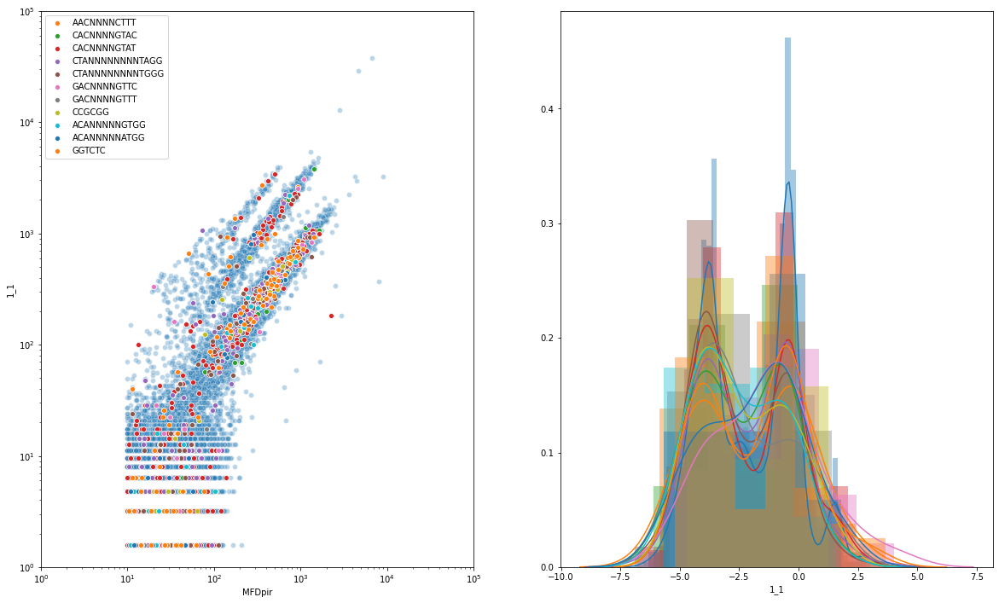

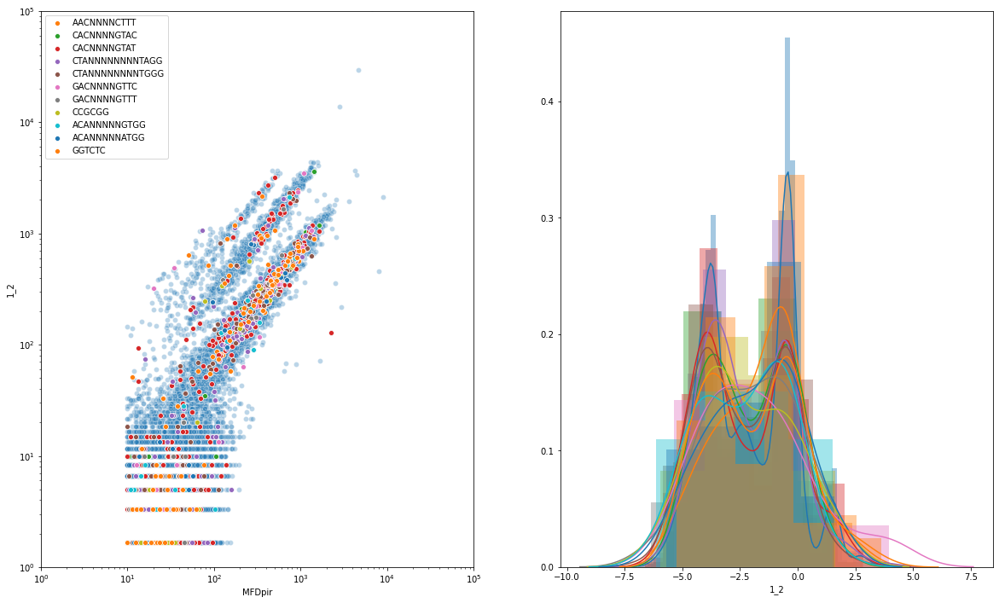

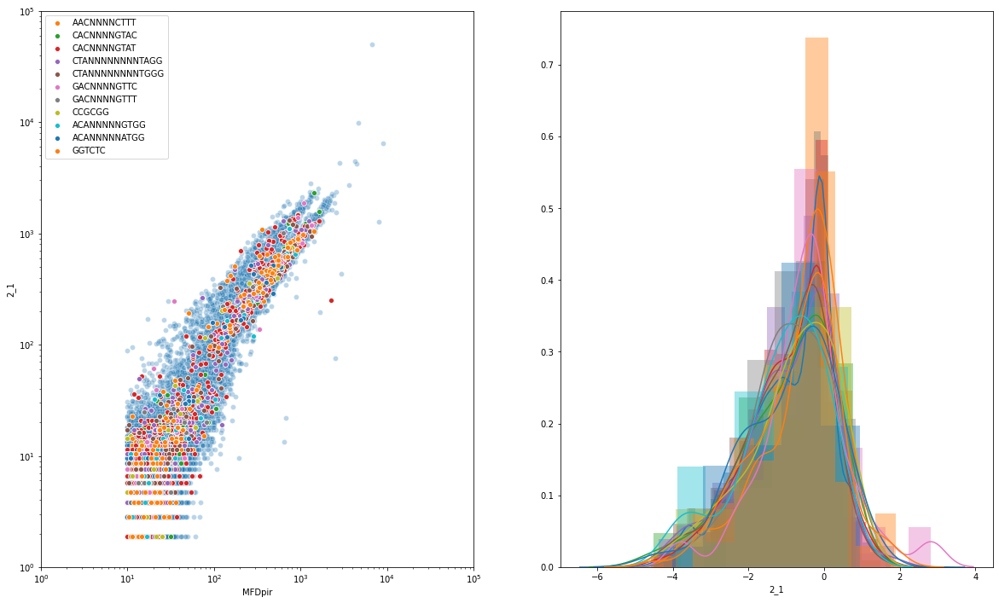

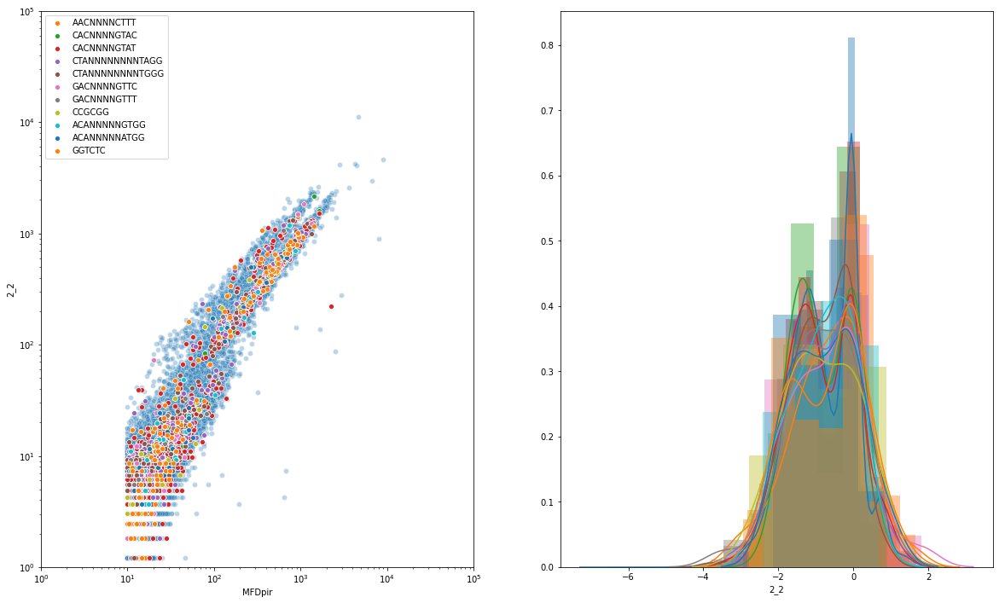

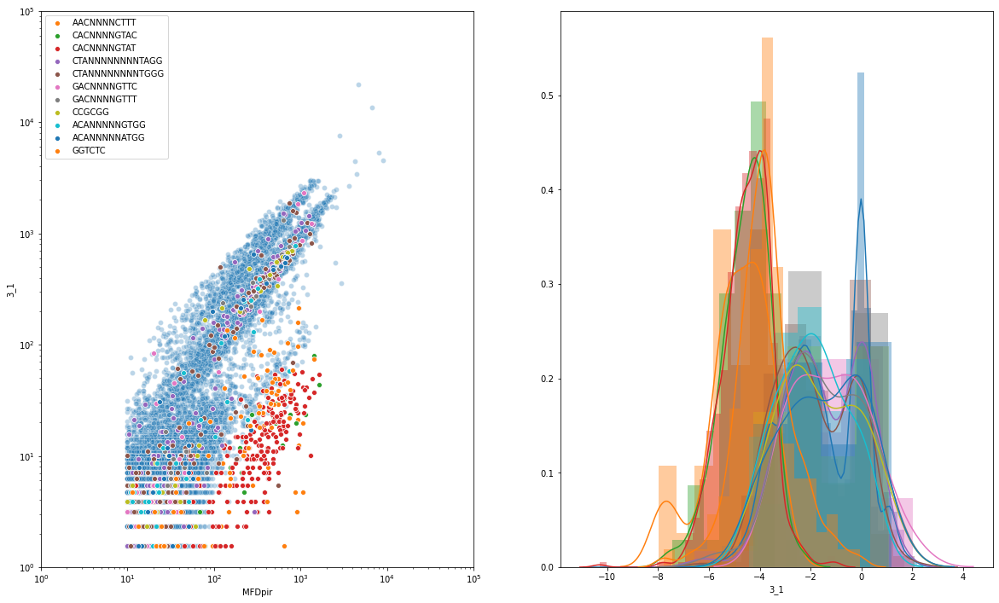

...

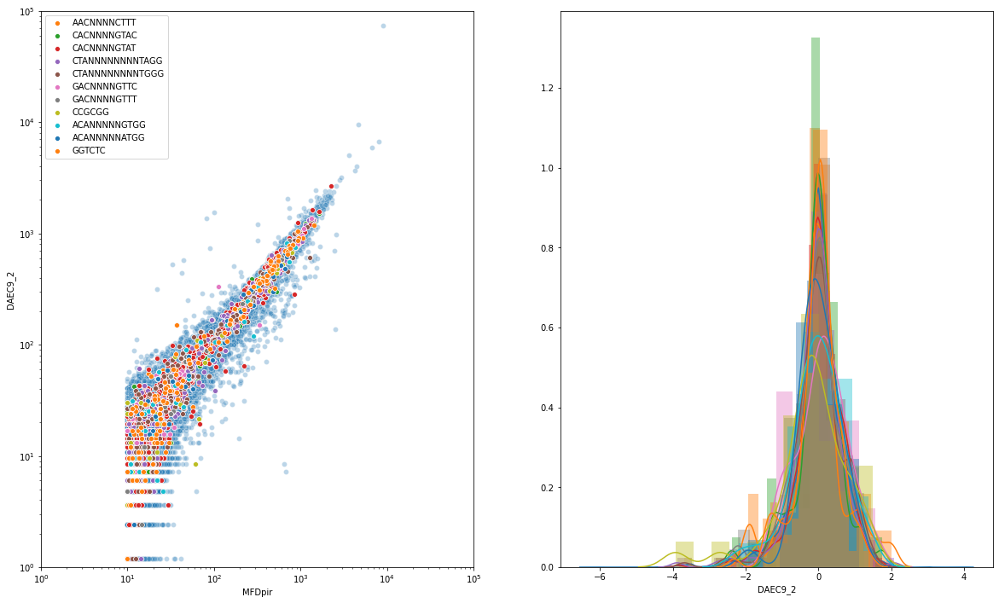

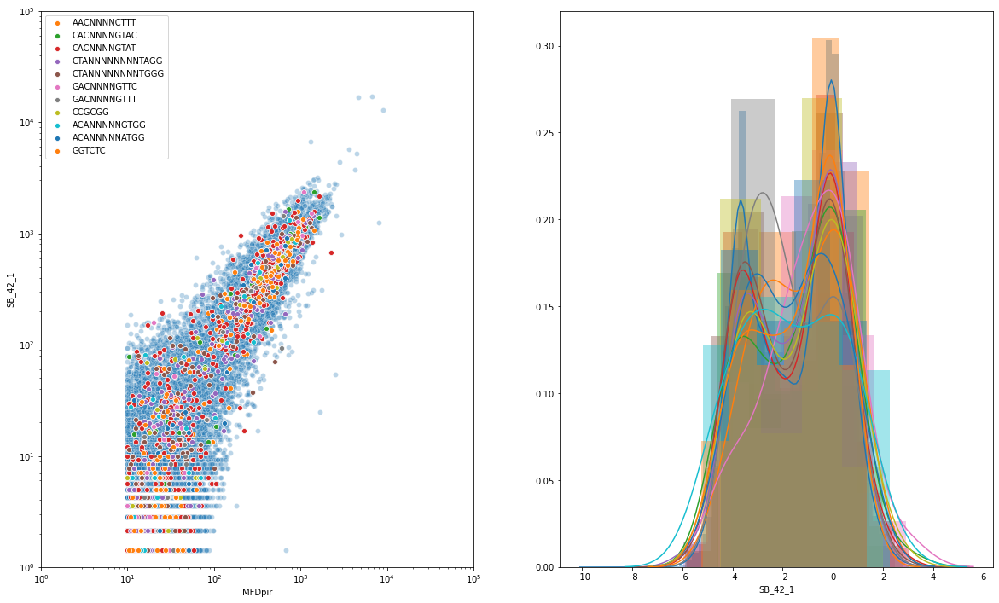

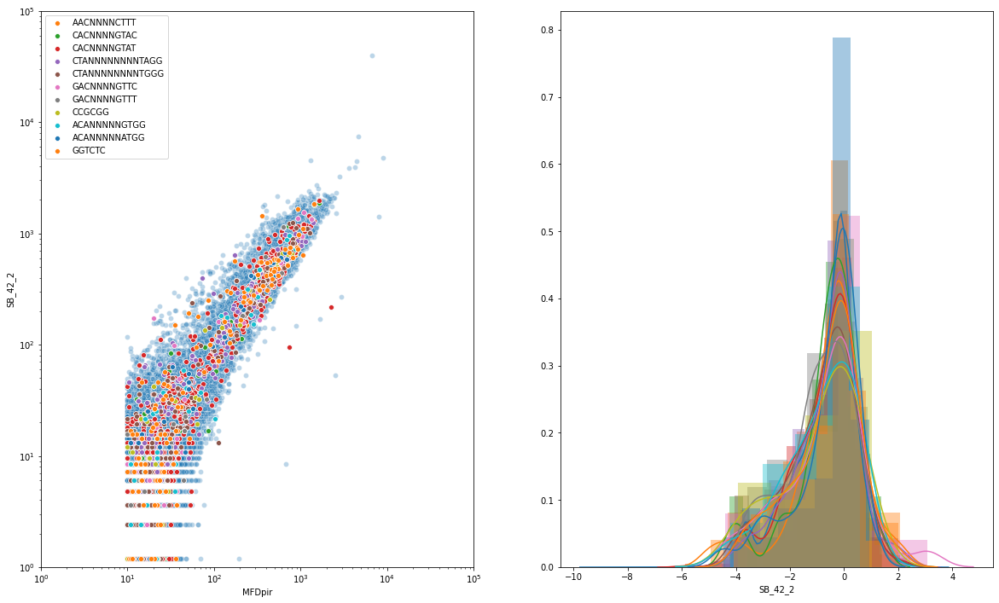

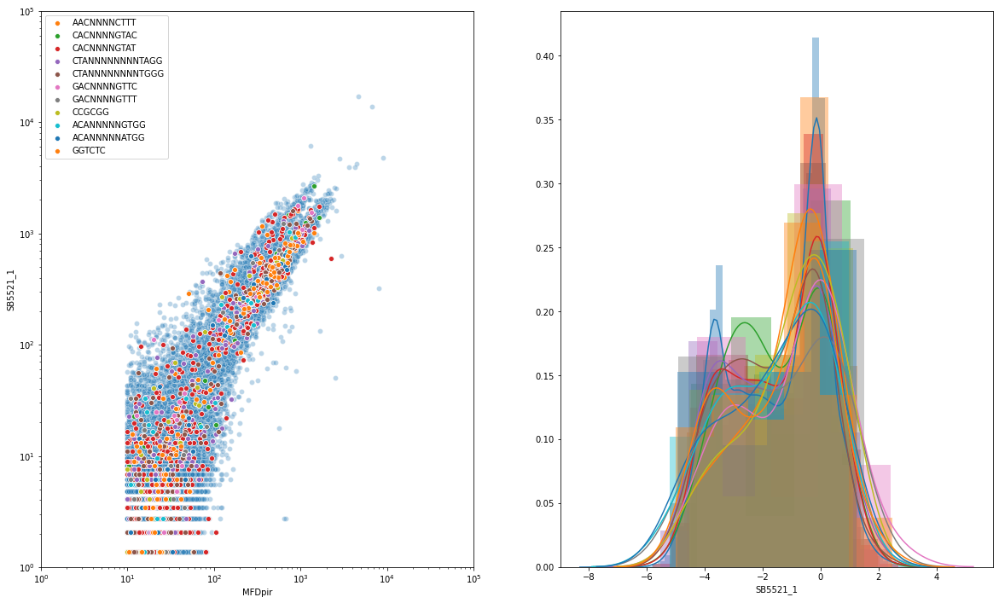

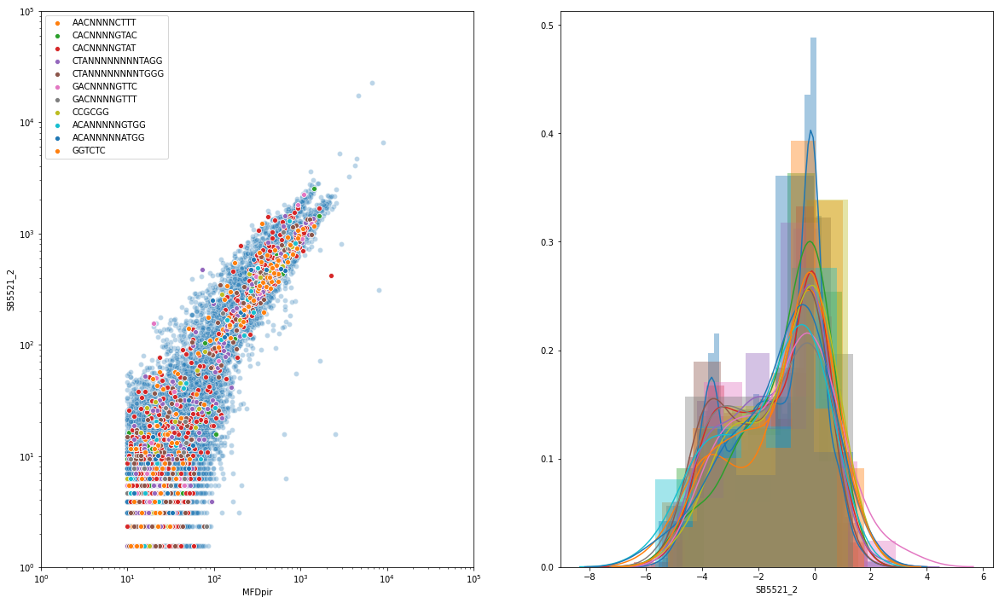

In [ ]:
for sample in samples:
    sites=["AACNNNNCTTT","CACNNNNGTAC","CACNNNNGTAT","CTANNNNNNNNTAGG","CTANNNNNNNNTGGG","GACNNNNGTTC","GACNNNNGTTT","CCGCGG","ACANNNNNGTGG","ACANNNNNATGG","GGTCTC"]
    fig, (ax1,ax2)= plt.subplots(1,2,figsize=(20,12))

    sns.scatterplot('MFDpir',sample,data=norm_data,ax=ax1,alpha=0.3)
    for site in sites:
        sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data[site],],ax=ax1,label=site)
    ax1.loglog()
    ax1.set_xlim([1,100000])
    ax1.set_ylim([1,100000])

    sns.distplot(log2FC[sample],ax=ax2)
    for site in sites:
        sns.distplot(log2FC.loc[log2FC[site],sample],ax=ax2)
    plt.show()

In [ ]:
found_sites

{'1_1': [('GGCNNNGTCG', (0.9090909090909091, 11)),
  ('CGTNNNCCCC', (0.9166666666666666, 12)),
  ('CGGNNNGGCG', (0.9375, 16)),
  ('GCGNNNNACCC', (0.9230769230769231, 13)),
  ('GCCNNNNGTTG', (1.0, 11)),
  ('CTGNNNNCTGC', (0.9375, 16)),
  ('CGTNNNNGCCG', (0.9230769230769231, 13)),
  ('CGCNNNNTGTG', (0.9230769230769231, 13)),
  ('CCCNNNNCTCG', (0.9230769230769231, 13)),
  ('GGGNNNNNCCGG', (0.9166666666666666, 12)),
  ('GCCNNNNNCCGT', (0.9090909090909091, 11)),
  ('AGGNNNNNNGCGT', (0.9333333333333333, 15)),
  ('GCANNNNNNCCTC', (0.9166666666666666, 12)),
  ('CGTNNNNNNACTG', (0.9047619047619048, 21)),
  ('CGGNNNNNNCGTG', (0.9090909090909091, 11)),
  ('CGCNNNNNNCTCT', (0.9090909090909091, 11)),
  ('CCANNNNNNGCCT', (0.9444444444444444, 18)),
  ('CCGNNNNNNACGC', (0.9090909090909091, 11))],
 '1_2': [('CGTNNATCG', (0.95, 20)),
  ('CGGNNGTCG', (0.9333333333333333, 15)),
  ('AGCNNNGGAG', (0.9166666666666666, 12)),
  ('GGCNNNGACC', (0.9090909090909091, 11)),
  ('GCGNNNTGGC', (0.9285714285714286, 14)

In [ ]:
fixed_pattern

{'1_1': [],
 '1_2': [],
 '2_1': [],
 '2_2': [],
 '3_1': [(('left', 3, 0), 'GTG', 0.9946236559139785)],
 '3_2': [(('left', 3, 0), 'GTG', 0.974910394265233)],
 '4_1': [],
 '4_2': [],
 '5_1': [],
 '5_2': [],
 '6_1': [],
 '6_2': [],
 '7_1': [(('left', 3, 0), 'GTG', 0.989247311827957)],
 '7_2': [(('left', 3, 0), 'GTG', 0.9874551971326165)],
 '8_1': [],
 '8_2': [],
 '9_1': [(('left', 3, 0), 'GTG', 0.9731182795698925)],
 '9_2': [(('left', 3, 0), 'GTG', 0.978494623655914)],
 '10_1': [],
 '10_2': [(('left', 3, 0), 'GTG', 0.967741935483871)],
 '11_1': [],
 '11_2': [],
 '12_1': [],
 '12_2': [],
 'phagemid': [],
 'B156_1': [],
 'B156_2': [],
 'ATCC8739_1': [],
 'ATCC8739_2': [],
 'B921_1': [],
 'B921_2': [],
 '55989_1': [],
 '55989_2': [],
 'H223_1': [],
 'H223_2': [],
 'IAI67_1': [],
 'IAI67_2': [],
 'B367_1': [(('left', 4, 6), 'TAGG', 0.9621212121212122),
  (('left', 4, 6), 'TGGG', 0.9632352941176471),
  (('right', 4, 2), 'TAGG', 0.9538461538461539)],
 'B367_2': [(('left', 4, 6), 'TAGG', 0.98484

In [ ]:
import json
thr=-2
found_sites=dict([(s,[]) for s in samples])
lib=get_lib_seq_context(list(log2FC.index),left,right)
for pattern in pattern_list[:2]:
    print(pattern)
    #print("Finding all possible sites with this pattern in the library...")
    set_list=lib2site_sets(lib,pattern=pattern,no_ori=True)
    allsites=get_all_sites(pattern)
    
    FCs=log2FC
    D=get_site_FCs()
    for sample in samples:
        print("###############\n"+sample+"\n##############")
        flt=get_fixed_flt(sample)
        if found_sites[sample]:
            print("removing sequences with detected sites from the analysis")
            for site, score in found_sites[sample]:
                flt=~log2FC[site] & flt

        log2FC_flt=log2FC[flt].copy()
        FCs=log2FC_flt[sample]
        
        lib_flt=[seq for i,seq in enumerate(lib) if flt[i]]
        set_list_flt=[s for i,s in enumerate(set_list) if flt[i]]

        

        #print("Getting the FCs of guides that contain each site...")
        site_FCs=get_FC_lists(set_list_flt,FCs)

        
        site_scores=dict([(s,(0,0)) for s in allsites])
        for site in allsites:
            if site in site_FCs:
                site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))
            else:
                print(site," not covered by library")
                continue #site not covered by library
        
        with open("site_scores/"+sample+str(pattern)+".json","w") as file:
            json.dump(site_scores,file)

        for site in site_scores:
            if site_scores[site][0]>0.9 and site_scores[site][1]>10:
                if revcomp(site) not in found_sites[sample]:
                    found_sites[sample].append((site,site_scores[site]))
                    log2FC[site]=[(site in s)  for s in set_list]
                    norm_data[site]=[(site in s) for s in set_list]
                    print(site, site_scores[site], "found!!!!")

        #print("\n".join(['\t'.join([site,str(site_scores[site])]) for site in site_scores if site_scores[site][0]>0.9]))

{'1_1': [],
 '1_2': [],
 '2_1': [],
 '2_2': [],
 '3_1': [],
 '3_2': [],
 '4_1': [],
 '4_2': [],
 '5_1': [],
 '5_2': [],
 '6_1': [],
 '6_2': [],
 '7_1': [],
 '7_2': [],
 '8_1': [],
 '8_2': [],
 '9_1': [],
 '9_2': [],
 '10_1': [],
 '10_2': [],
 '11_1': [],
 '11_2': [],
 '12_1': [],
 '12_2': [],
 'phagemid': [],
 'B156_1': [],
 'B156_2': [],
 'ATCC8739_1': [],
 'ATCC8739_2': [],
 'B921_1': [],
 'B921_2': [],
 '55989_1': [],
 '55989_2': [],
 'H223_1': [],
 'H223_2': [],
 'IAI67_1': [],
 'IAI67_2': [],
 'B367_1': [],
 'B367_2': [],
 'DAEC9_1': [],
 'DAEC9_2': [],
 'SB_42_1': [],
 'SB_42_2': [],
 'SB5521_1': [],
 'SB5521_2': []}

In [ ]:
log2FC["GAGACC"]=[("GAGACC" in s)  for s in set_list]
norm_data["GAGACC"]=[("GAGACC" in s) for s in set_list]

In [ ]:
log2FC["AGTGTG"]=[("AGTGTG" in s) for s in set_list]
norm_data["AGTGTG"]=[("AGTGTG" in s) for s in set_list]

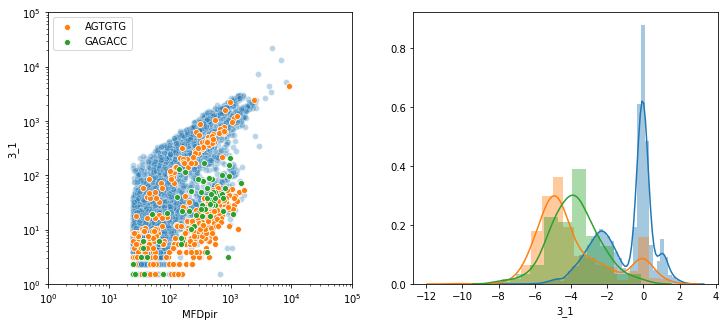

In [ ]:
fig, (ax1,ax2)= plt.subplots(1,2,figsize=(12,5))
sns.scatterplot('MFDpir',sample,data=norm_data,ax=ax1,alpha=0.3)
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["AGTGTG"],],ax=ax1,label="AGTGTG")
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["GAGACC"],],ax=ax1,label="GAGACC")
ax1.loglog()
ax1.set_xlim([1,100000])
ax1.set_ylim([1,100000])

sns.distplot(log2FC.loc[~(log2FC["AGTGTG"]|log2FC["GAGACC"]),sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["AGTGTG"],sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["GAGACC"],sample],ax=ax2)
plt.show()

In [ ]:
log2FC.loc[log2FC["AGTGTG"] & (log2FC["3_1"]>-0.5)].index

Index(['AAAAGTGTGAGGTCCTGATC', 'AAAGGCTTCTAGTGTGGAGC', 'AAAGTGTGATCTTGTGCGAC',
       'AACTCTAAGTGTGCTTCGGG', 'AAGGTAATGGCTTAAGTGTG', 'AAGTGTGCTATGTCCTGTTG',
       'AAGTGTGCTCTATAATTAAA', 'AATTTTGTGGAGTGTGCTTT', 'ACGCCTTAAGTGTGATGGGT',
       'ACTCTGCTGGAGTGTGTGTA', 'AGTGTGACAAGTTGCATCGG', 'AGTGTGATCTATATTTTTTG',
       'AGTGTGTATCCGATGTCCTA', 'AGTGTGTTATTTCTGGTAAA', 'ATGTGTACAGTGTGAGGGCA',
       'ATTGGCTTTTAAGTGTGAGA', 'CAAGTGTGTTTTTTGGTGAG', 'CACACTAAATTGCGAGAGAG',
       'CACACTCAATAATCTTTGAT', 'CAGTGTGTCTGGTGACTTAT', 'CATTTATGTATGCACACTTG',
       'CCAAGTGTGAGTCAATTCGT', 'CCAGTAATTCTCAGTGTGTA', 'CGAGTGTGACGGTCAGTCCT',
       'CGGAATCAGTGGCACACTAG', 'CGGACAATCACAGTGTGATT', 'CTAGTGTGGTAACGGGTAGA',
       'CTATCGAGAGTGTGTGACTA', 'CTCAAGTGTGATGTCCATAT', 'CTCGCGAGCAGTGTGTCTGG',
       'CTGAAACATCGAAGTGTGGT', 'CTGAATTGCTTCTTAGTGTG', 'GAAAGTGTGGACGTAAACAG',
       'GAAGTGTGTTACAATTTTTG', 'GACTTAGTAGTGTGTTCAAT', 'GACTTGAGAGTGTGTGTAAT',
       'GAGTGTGATCGGTTTTTAAT', 'GCAGTGTGTAAACAGTAAGT

In [ ]:
depCACTC=log2FC.loc[log2FC["AGTGTG"] & (log2FC["3_1"]<-2)]
sum([s[:3]=="GTG" for s in depCACTC.index]),len(depCACTC)

(343, 401)

The vast majority of the depleted sequences with the CACATC / GATGTG motif start with GTG and form the motif with the left sequence: gcgtaaagggactagtggatGTG

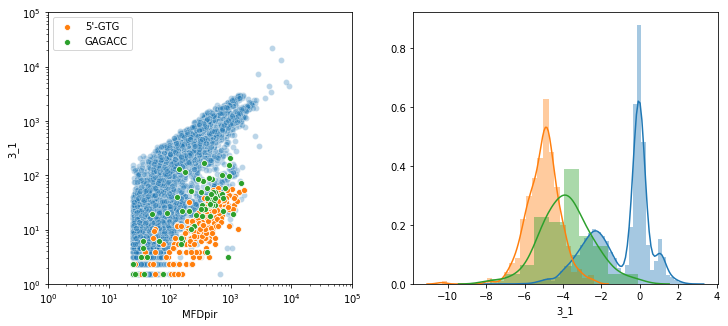

In [ ]:
#gcgtaaagggactagtggatGTG

log2FC["GTG"]=log2FC.index.str[:3]=="GTG"
norm_data["GTG"]=log2FC.index.str[:3]=="GTG"

fig, (ax1,ax2)= plt.subplots(1,2,figsize=(12,5))
sns.scatterplot('MFDpir',sample,data=norm_data,ax=ax1,alpha=0.3)
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["GTG"],],ax=ax1,label="5'-GTG")
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["GAGACC"],],ax=ax1,label="GAGACC")
ax1.loglog()
ax1.set_xlim([1,100000])
ax1.set_ylim([1,100000])

sns.distplot(log2FC.loc[~(log2FC["GTG"]|log2FC["GAGACC"]),sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["GTG"],sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["GAGACC"],sample],ax=ax2)
plt.show()

The identification of the actual restriction site that ends with GTG is made complicated by the fact that all long sites that can be formed between the left sequence and GTG will be strongly depleted in the library. We need to look for depleted sites that end with GTG but that do not overlap with the left junction. 

Let's first try to run the analysis again but first excluding the sequences that start with GTG (and those that contain the already identified GAGACC site). We can also reduce the threshold value since we see a very strong depletion signal for the GTG sequences.

In [ ]:
sample="3_1"

thr=-2

log2FC_flt=log2FC[(~log2FC["GTG"]) & (~log2FC["GAGACC"])]
print(log2FC.shape,log2FC_flt.shape)
lib=get_lib_seq_context(list(log2FC_flt.index),left,right)

for pattern in [(3,7,4),(3,6,4),(3,5,4),(3,4,4),(4,4,3),(3,3,4)]:
    print(pattern)
    print("Finding all possible sites with this pattern in the library...")
    set_list=lib2site_sets(lib,pattern=pattern,no_ori=True)
    FCs=log2FC_flt[sample]

    print("Getting the FCs of guides that contain each site...")
    site_FCs=get_FC_lists(set_list,FCs)

    allsites=get_all_sites(pattern)
    site_scores=dict([(s,(0,0)) for s in allsites])
    for site in allsites:
        if site in site_FCs:
            site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))
        else:
            print(site," not covered by library")
            continue #site not covered by library
            
    print("\n".join(['\t'.join([site,str(site_scores[site])]) for site in site_scores if site_scores[site][0]>0.7]))

(16798, 49) (16377, 49)
(3, 7, 4)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...
GGGNNNNNNNGCCC  not covered by library
GCCNNNNNNNCTGC  not covered by library
GCCNNNNNNNCGCC  not covered by library
CCTNNNNNNNCCGG  not covered by library
CCGNNNNNNNGCGG  not covered by library
AAGNNNNNNNAGGG	(0.75, 8)
AGANNNNNNNGGGG	(0.7142857142857143, 7)
AGANNNNNNNCGGG	(0.75, 4)
AGGNNNNNNNAACC	(0.8333333333333334, 6)
AGGNNNNNNNACGC	(0.8, 10)
AGGNNNNNNNTCGC	(1.0, 1)
AGCNNNNNNNTTGC	(0.8, 5)
ACANNNNNNNAGGC	(0.7142857142857143, 7)
ACGNNNNNNNAGGG	(0.8, 5)
ACGNNNNNNNAGCG	(0.7142857142857143, 7)
ACGNNNNNNNTCCG	(0.75, 8)
ACGNNNNNNNGGAG	(0.7142857142857143, 7)
ACGNNNNNNNGGGA	(0.75, 8)
ACGNNNNNNNGCCG	(0.75, 4)
ACGNNNNNNNCTCT	(0.7142857142857143, 7)
ACGNNNNNNNCTCG	(0.75, 4)
ACCNNNNNNNTGCG	(0.7142857142857143, 7)
ACCNNNNNNNCACC	(0.7272727272727273, 11)
TTGNNNNNNNAGCC	(0.7142857142857143, 7)
TCCNNNNNNNTCGC	(0.8333333333333334, 6)
TCCNNNNNNNCGTG	(0.

So we have:

AAAGNNNNGTT	(1.0, 26)
CACNNNNGTAT	(1.0, 35)
CACNNNNGTAC	(1.0, 34)

CACNNNNGTAY / RTACNNNNGTG is an interesting candidate to explain the depletion of 5'-GTG. Let's see if this is the site made with the left sequence:

In [ ]:
#------------RTACNNNNGTG
#gtgctaggtataatactagtGTG

# Yes, we found it!

In [ ]:
norm_data_flt=norm_data[(~norm_data["GTG"]) & (~norm_data["GAGACC"])]
set_list=lib2site_sets(lib,pattern=(3, 4, 4),no_ori=True)
log2FC_flt["AACNNNNCTTT"]=[("AACNNNNCTTT" in s) for s in set_list]
norm_data_flt["AACNNNNCTTT"]=[("AACNNNNCTTT" in s) for s in set_list]

log2FC_flt["CACNNNNGTAY"]=[("CACNNNNGTAC" in s) | ("CACNNNNGTAT" in s) for s in set_list]
norm_data_flt["CACNNNNGTAY"]=[("CACNNNNGTAC" in s) | ("CACNNNNGTAT" in s) for s in set_list]

C:\Users\dbikard\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\dbikard\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\dbikard\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set o

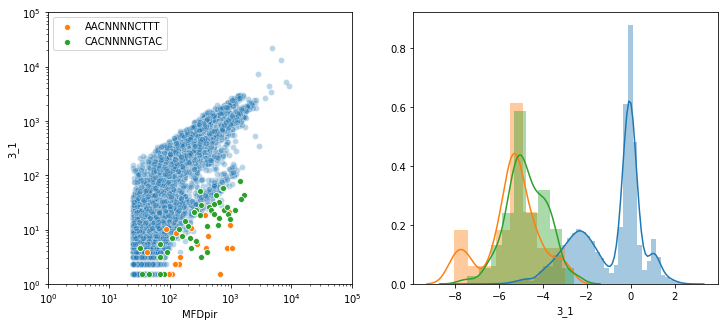

In [ ]:
fig, (ax1,ax2)= plt.subplots(1,2,figsize=(12,5))
sns.scatterplot('MFDpir',sample,data=norm_data_flt,ax=ax1,alpha=0.3)
sns.scatterplot('MFDpir',sample,data=norm_data_flt.loc[norm_data_flt["AACNNNNCTTT"],],ax=ax1,label="AACNNNNCTTT")
sns.scatterplot('MFDpir',sample,data=norm_data_flt.loc[norm_data_flt["CACNNNNGTAY"],],ax=ax1,label="CACNNNNGTAC")
ax1.loglog()
ax1.set_xlim([1,100000])
ax1.set_ylim([1,100000])

sns.distplot(log2FC_flt[sample],ax=ax2)
sns.distplot(log2FC_flt.loc[log2FC_flt["AACNNNNCTTT"],sample],ax=ax2)
sns.distplot(log2FC_flt.loc[log2FC_flt["CACNNNNGTAY"],sample],ax=ax2)
plt.show()

Almost 40% of sequences are depleted. If a sequence pattern is responsible for this it needs to be short enough to occur 40% of the time in a 20nt sequence. 

In [ ]:
from random import shuffle
l=list(log2FC_flt[log2FC_flt[sample]<-2].index)
shuffle(l)
print("\n".join(l[:20]))

AGGTCATATTTGTATTAGAT
ATAGCGTTCTAACGGGCAGC
CGTTTTCTTTAAAACTTTAG
CGCTGTATTGTAGTGCCCAT
GCGAATTTCGTCGCTGCCGG
ATACTCGACGAATCTCTTCA
GGGCAGATGCTTGTTGAATA
TCCACTAACCGAGTGAGTCA
GGGTAGTACCAGGTGTGTTC
GTCCGGAAAGTCGTGTTCTA
CTTCATGGAATAAACTCGTA
GCGGTGCGCGCTTGTTTTGT
TCAAACTGTAGAAATCATTG
GTAAAGGGTGTTTCTGGTGT
AGGCGATTTGATAGTTTCTA
GCGTTCGTTTTCTAGTCATG
TATATCCCGTGCGGATGGAA
GTTTTTGACGCCCTGGGTGA
GGGTAGTCACTAGGGCTTAC
TAGGTTCTACAATAGCCAGT


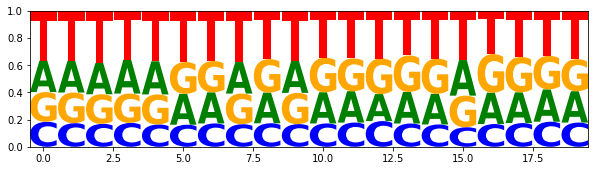

In [ ]:
import logomaker
N=len(l)
logo_df=pd.DataFrame(dict([(b,[sum([s[i]==b for s in l])/N for i in range(len(l[0]))]) for b in bases]))
logomaker.Logo(logo_df)

In [ ]:
bases=list("ATGC")
def randseq(L):
    return ''.join([choice(bases) for i in range(L)])

def occurence_p(pattern,N=int(1e5)):
    #brut force appraoch
    lib=[randseq(20) for i in range(N)]
    l=[len(re.findall("A"*pattern[0]+"[ATGC]"*pattern[1]+"A"*pattern[2],s))>0 for s in lib]
    return sum(l)/N

occurence_p((2,0,0)),occurence_p((3,0,0))

(0.64208, 0.20069)

Maybe it's the other way around and there is something special about the non depleted / enriched sequences

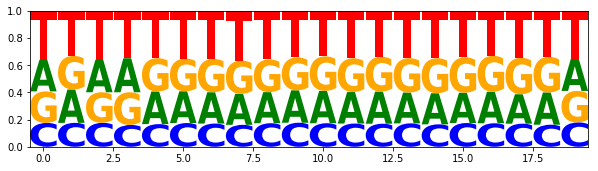

In [ ]:
from random import shuffle
l=list(log2FC_flt[(log2FC_flt[sample]>-1) & (log2FC_flt[sample]<0.5)].index)
shuffle(l)
N=len(l)
logo_df=pd.DataFrame(dict([(b,[sum([s[i]==b for s in l])/N for i in range(len(l[0]))]) for b in bases]))
logomaker.Logo(logo_df)

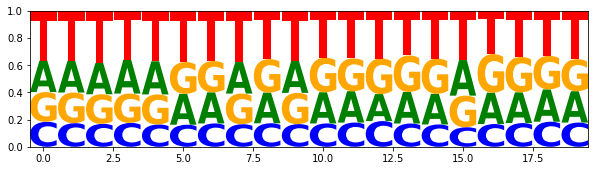

In [ ]:
l=list(log2FC_flt[(log2FC_flt[sample]>0.5)].index)
shuffle(l)
N=len(l)
logo_df=pd.DataFrame(dict([(b,[sum([s[i]==b for s in l])/N for i in range(len(l[0]))]) for b in bases]))
logomaker.Logo(logo_df)

There is nothing obvious that is common to these sequences

Maybe a neural network would pickup something ?

In [ ]:
!pip install tensorflow --upgrade

In [ ]:
bases=["A","T","G","C"]
def encode(seq):
    return np.array([[int(b==p) for b in seq] for p in bases])

def encode_seqarr(seqlist,dim=1):
    X_seq = np.array([encode(s) for s in seqlist])
    if dim==1:
        X_seq = X_seq.reshape((X_seq.shape[0],X_seq.shape[1]*X_seq.shape[2]))
        return X_seq
    elif dim==2:
        return X_seq.swapaxes(1,2)

In [ ]:
X=encode_seqarr(l,dim=2)
X.shape



(1570, 20, 4)

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

model = keras.Sequential(
    [
        keras.Input(shape=input_shape),
        layers.Conv2D(32, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Flatten(),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation="tanh"),
    ]
)

model.summary()


ModuleNotFoundError: No module named 'tensorflow.keras'

In [ ]:
N=X.shape[0]
permidx=np.random.permutation(N)
trainis=permidx[:int(0.8*N)]
validis=permidx[int(0.8*N):int(0.9*N)]
testis=permidx[int(0.9*N):]

model.fit(X[trainis], Y[trainis], 
          epochs=100, batch_size=32, 
          validation_data=[X[validis], Y[validis]], verbose=2)

In [ ]:
#gcgtaaagggactagtggatGTG

log2FC["GTG"]=log2FC.index.str[:3]=="GTG"
norm_data["GTG"]=log2FC.index.str[:3]=="GTG"

fig, (ax1,ax2)= plt.subplots(1,2,figsize=(12,5))
sns.scatterplot('MFDpir',sample,data=norm_data,ax=ax1,alpha=0.3)
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["GTG"],],ax=ax1,label="5'-GTG")
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["GAGACC"],],ax=ax1,label="GAGACC")
ax1.loglog()
ax1.set_xlim([1,100000])
ax1.set_ylim([1,100000])

sns.distplot(log2FC.loc[~(log2FC["GTG"]|log2FC["GAGACC"]),sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["GTG"],sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["GAGACC"],sample],ax=ax2)
plt.show()

In [ ]:
sample="3_1"

thr=-3

log2FC_flt=log2FC[(~log2FC["GTG"]) & (~log2FC["GAGACC"])]
print(log2FC.shape,log2FC_flt.shape)
lib=get_lib_seq_context(list(log2FC_flt.index),"gcgtaaagggactagtggat","actagtattatacctagcac")

for pattern in [(3,2,4),(3,1,4)]:
    print(pattern)
    print("Finding all possible sites with this pattern in the library...")
    set_list=lib2site_sets(lib,pattern=pattern,no_ori=True)
    FCs=log2FC_flt[sample]

    print("Getting the FCs of guides that contain each site...")
    site_FCs=get_FC_lists(set_list,FCs)

    allsites=get_all_sites(pattern)
    site_scores=dict([(s,(0,0)) for s in allsites])
    for site in allsites:
        if site in site_FCs:
            site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))
        else:
            print(site," not covered by library")
            continue #site not covered by library
            
    print("\n".join(['\t'.join([site,str(site_scores[site])]) for site in site_scores if site_scores[site][0]>0.7]))

(16798, 48) (16377, 48)
(3, 2, 4)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...

(3, 1, 4)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...
CGCNGCGT	(1.0, 2)


In [ ]:
#looking for more possible patterns
thr=-3

log2FC_flt=log2FC[(~log2FC["GTG"]) & (~log2FC["GAGACC"])]
print(log2FC.shape,log2FC_flt.shape)
lib=get_lib_seq_context(list(log2FC_flt.index),"gcgtaaagggactagtggat","actagtattatacctagcac")

for pattern in [(3,1,3),(3,2,3),(3,3,3),(3,4,3),(3,5,3),(3,6,3),(3,7,3),
                (2,1,3),(2,2,3),(2,3,3),(2,4,3),(2,5,3),(2,6,3),(2,7,3)]:
    print(pattern)
    print("Finding all possible sites with this pattern in the library...")
    set_list=lib2site_sets(lib,pattern=pattern,no_ori=True)
    FCs=log2FC_flt[sample]

    print("Getting the FCs of guides that contain each site...")
    site_FCs=get_FC_lists(set_list,FCs)

    allsites=get_all_sites(pattern)
    site_scores=dict([(s,(0,0)) for s in allsites])
    for site in allsites:
        if site in site_FCs:
            site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))
        else:
            continue #site not covered by library
            
    print("\n".join(['\t'.join([site,str(site_scores[site])]) for site in site_scores if site_scores[site][0]>0.2]))

(16798, 48) (16377, 48)
(3, 1, 3)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...

(3, 2, 3)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...

(3, 3, 3)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...

(3, 4, 3)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...

(3, 5, 3)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...

(3, 6, 3)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...

(3, 7, 3)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...

(2, 1, 3)
Finding all possible sites with this pattern in the library...
Getting the FCs of gu

In [ ]:
sample="3_1"

thr=-3
p=0.7

log2FC_flt=log2FC[(~log2FC["GTG"]) & (~log2FC["GAGACC"])]
print(log2FC.shape,log2FC_flt.shape)
lib=get_lib_seq_context(list(log2FC_flt.index),"gcgtaaagggactagtggat","actagtattatacctagcac")

for pattern in [(7,0,0)]:
    print(pattern)
    print("Finding all possible sites with this pattern in the library...")
    set_list=lib2site_sets(lib,pattern=pattern,no_ori=True)
    FCs=log2FC_flt[sample]

    print("Getting the FCs of guides that contain each site...")
    site_FCs=get_FC_lists(set_list,FCs)

    allsites=get_all_sites(pattern)
    site_scores=dict([(s,(0,0)) for s in allsites])
    for site in allsites:
        if site in site_FCs:
            site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))
        else:
            print(site," not covered by library")
            continue #site not covered by library
            
    print("\n".join(['\t'.join([site,str(site_scores[site])]) for site in site_scores if site_scores[site][0]>p]))

(16798, 48) (16377, 48)
(7, 0, 0)
Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...
AGAGACC  not covered by library
AGGTCTC  not covered by library
TGAGACC  not covered by library
TGGTCTC  not covered by library
GAGACCA  not covered by library
GAGACCT  not covered by library
GAGACCG  not covered by library
GAGACCC  not covered by library
GGAGACC  not covered by library
GGTCTCA  not covered by library
GGTCTCT  not covered by library
GGTCTCG  not covered by library
GGTCTCC  not covered by library
GGGTCTC  not covered by library
CGAGACC  not covered by library
CGGTCTC  not covered by library



In [ ]:
re.match("ACT[ATGC]{6}TGTG", "CGCGATGCGCTAGACTCGTAGTTGTGCGTACG")

[]

In [ ]:
log2FC["ACTNNNNNNTGTG"]=[("ACTNNNNNNTGTG" in s) or ("CACANNNNNNAGT" in s) for s in set_list]
norm_data["ACTNNNNNNTGTG"]=[("ACTNNNNNNTGTG" in s) or ("CACANNNNNNAGT" in s) for s in set_list]

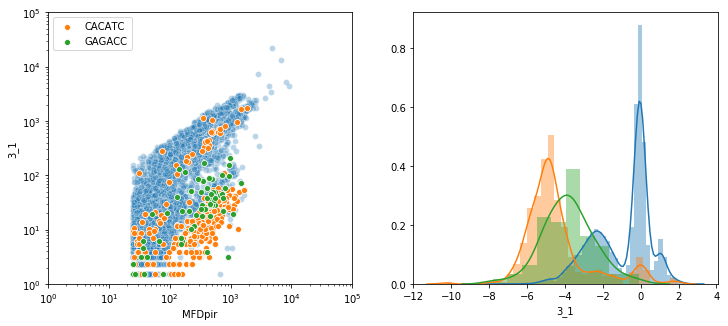

In [ ]:
fig, (ax1,ax2)= plt.subplots(1,2,figsize=(12,5))
sns.scatterplot('MFDpir',sample,data=norm_data,ax=ax1,alpha=0.3)
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["ACTNNNNNNTGTG"],],ax=ax1,label="CACATC")
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["GAGACC"],],ax=ax1,label="GAGACC")
ax1.loglog()
ax1.set_xlim([1,100000])
ax1.set_ylim([1,100000])

sns.distplot(log2FC.loc[~(log2FC["ACTNNNNNNTGTG"]|log2FC["GAGACC"]),sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["ACTNNNNNNTGTG"],sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["GAGACC"],sample],ax=ax2)
plt.show()

In [ ]:
sample="3_1"
pattern=(7,0,0)


lib=get_lib_seq_context(list(log2FC.index),"gcgtaaagggactagtggat","actagtattatacctagcac")
print("Finding all possible sites with this pattern in the library...")
set_list=lib2site_sets(lib,pattern=pattern,no_ori=True)
FCs=log2FC[sample]

print("Getting the FCs of guides that contain each site...")
site_FCs=get_FC_lists(set_list,FCs)

allsites=get_all_sites(pattern)
site_scores=dict([(s,(0,0)) for s in allsites])
for site in allsites:
    if site in site_FCs:
        site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))

Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...


In [ ]:
[(site,site_scores[site]) for site in site_scores 
                         if (site_scores[site][0]>0.8)
                         and ('GAGACC' not in site) 
                         and ('GGTCTC' not in site)]

[('ACACATC', (0.8285714285714286, 140)),
 ('GATGTGT', (0.8285714285714286, 140)),
 ('GATGTGG', (0.8518518518518519, 108)),
 ('GATGTGC', (0.8415841584158416, 101)),
 ('GGATGTG', (0.9616438356164384, 365)),
 ('GCACATC', (0.8415841584158416, 101)),
 ('CACATCC', (0.9616438356164384, 365)),
 ('CCACATC', (0.8518518518518519, 108))]

365


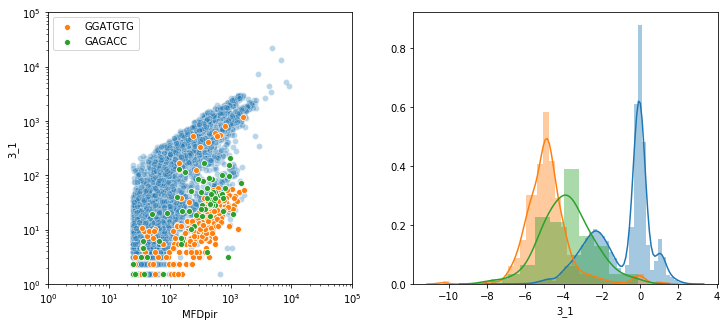

In [ ]:
#gcgtaaagggactagtggatGTG

log2FC["GGATGTG"]=[("GGATGTG" in s) for s in set_list]
norm_data["GGATGTG"]=[("GGATGTG" in s) for s in set_list]
print(sum([("GGATGTG" in s) or ("CACATCC" in s) for s in set_list]))

fig, (ax1,ax2)= plt.subplots(1,2,figsize=(12,5))
sns.scatterplot('MFDpir',sample,data=norm_data,ax=ax1,alpha=0.3)
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["GGATGTG"],],ax=ax1,label="GGATGTG")
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["GAGACC"],],ax=ax1,label="GAGACC")
ax1.loglog()
ax1.set_xlim([1,100000])
ax1.set_ylim([1,100000])

sns.distplot(log2FC.loc[~(log2FC["GGATGTG"]|log2FC["GAGACC"]),sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["GGATGTG"],sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["GAGACC"],sample],ax=ax2)
plt.show()

In [ ]:
log2FC.loc[log2FC["GGATGTG"] & (log2FC["3_1"]>-0.5)].index

Index(['CTCCATTGGGATGTGTCAGC', 'GTTGCTTAGGATGTGCCTGT', 'TAATGTTGGGATGTGCCTTT',
       'TAGGTTGGATGTGAACGGCG', 'TATGGATGTGTATGGGTCAC', 'TATTAATTTTGGGATGTGTG',
       'TCCCACATCCCGTAGTCTCA', 'TCGGGCGTGCACCGGATGTG', 'TCTTGGATGTGATTTGTTAC',
       'TGAGTTTGACGGATGTGGGA'],
      dtype='object')

This is likely not the site that explains the depletions since as soon as the site is internal and not on the edge the sequence is no longer depleted.

In [ ]:
sample="3_1"
pattern=(3,5,4)

lib=get_lib_seq_context(list(log2FC.index),"gcgtaaagggactagtggat","actagtattatacctagcac")
print("Finding all possible sites with this pattern in the library...")
set_list=lib2site_sets(lib,pattern=pattern,no_ori=True)
FCs=log2FC[sample]

print("Getting the FCs of guides that contain each site...")
site_FCs=get_FC_lists(set_list,FCs)

allsites=get_all_sites(pattern)
site_scores=dict([(s,(0,0)) for s in allsites])
for site in allsites:
    if site in site_FCs:
        site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))
    else:
        continue #site not covered by library
    
[(site,site_scores[site]) for site in site_scores if site_scores[site][0]>0.8]

Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...


[('AGANNNNNCCCG', (0.8888888888888888, 9)),
 ('ACCNNNNNCGGG', (1.0, 1)),
 ('GAGNNNNNAGCG', (0.875, 8)),
 ('GAGNNNNNACTG', (0.8333333333333334, 6)),
 ('GGGNNNNNACGC', (1.0, 2)),
 ('GCCNNNNNACGG', (0.8571428571428571, 7)),
 ('GCCNNNNNACGC', (0.8571428571428571, 7)),
 ('GCCNNNNNGACG', (1.0, 1)),
 ('CACNNNNNCTAG', (0.805327868852459, 488)),
 ('CTANNNNNTGTG', (0.9189873417721519, 395)),
 ('CGTNNNNNTCCG', (1.0, 2)),
 ('CGGNNNNNTTCT', (1.0, 6)),
 ('CGGNNNNNTCCC', (1.0, 3)),
 ('CGCNNNNNACCG', (0.8181818181818182, 11)),
 ('CGCNNNNNGCGC', (1.0, 1)),
 ('CCTNNNNNTCCC', (1.0, 3)),
 ('CCGNNNNNCGGT', (1.0, 2))]

In [ ]:
sample="3_1"
pattern=(3,5,3)

lib=get_lib_seq_context(list(log2FC.index),"gcgtaaagggactagtggat","actagtattatacctagcac")
print("Finding all possible sites with this pattern in the library...")
set_list=lib2site_sets(lib,pattern=pattern,no_ori=True)
FCs=log2FC[sample]

print("Getting the FCs of guides that contain each site...")
site_FCs=get_FC_lists(set_list,FCs)

allsites=get_all_sites(pattern)
site_scores=dict([(s,(0,0)) for s in allsites])
for site in allsites:
    if site in site_FCs:
        site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))
    else:
        continue #site not covered by library
    
[(site,site_scores[site]) for site in site_scores if site_scores[site][0]>0.8]

Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...


[]

In [ ]:
log2FC["GGATGTG"]=[("GGATGTG" in s) for s in set_list]
norm_data["GGATGTG"]=[("GGATGTG" in s) for s in set_list]

3_1 -0.2713099372781129


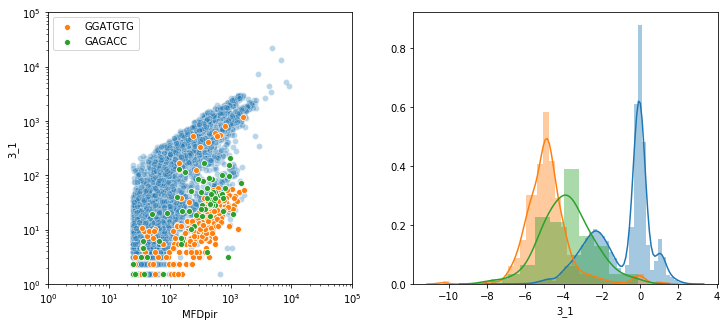

In [ ]:
print(sample,np.median(log2FC[sample]))
fig, (ax1,ax2)= plt.subplots(1,2,figsize=(12,5))
sns.scatterplot('MFDpir',sample,data=norm_data,ax=ax1,alpha=0.3)
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["GGATGTG"],],ax=ax1,label="GGATGTG")
sns.scatterplot('MFDpir',sample,data=norm_data.loc[norm_data["GAGACC"],],ax=ax1,label="GAGACC")
ax1.loglog()
ax1.set_xlim([1,100000])
ax1.set_ylim([1,100000])

sns.distplot(log2FC.loc[~(log2FC["GGATGTG"]|log2FC["GAGACC"]),sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["GGATGTG"],sample],ax=ax2)
sns.distplot(log2FC.loc[log2FC["GAGACC"],sample],ax=ax2)
plt.show()

In [ ]:
sample="3_1"
pattern=(8,0,0)


lib=get_lib_seq_context(list(log2FC.index),"gcgtaaagggactagtggat","actagtattatacctagcac")
print("Finding all possible sites with this pattern in the library...")
set_list=lib2site_sets(lib,pattern=pattern,no_ori=True)
FCs=log2FC[sample]

print("Getting the FCs of guides that contain each site...")
site_FCs=get_FC_lists(set_list,FCs)

allsites=get_all_sites(pattern)
site_scores=dict([(s,(0,0)) for s in allsites])
for site in allsites:
    if site in site_FCs:
        site_scores[site]=(sum([x<thr for x in site_FCs[site]])/len(site_FCs[site]),len(site_FCs[site]))
    else:
        continue #site not covered by library

Finding all possible sites with this pattern in the library...
Getting the FCs of guides that contain each site...


In [ ]:
[(site,site_scores[site]) for site in site_scores 
                         if (site_scores[site][0]>0.8)
                         and ('GAGACC' not in site) 
                         and ('GGTCTC' not in site)
                         and ('GGATGTG' not in site)
                         and ('CACATGG' not in site)
                         and site_scores[site][1]>10
]

[('AACACATC', (0.86, 50)),
 ('ATGTGATG', (0.9166666666666666, 12)),
 ('ATGTGGGC', (0.8461538461538461, 13)),
 ('AGACCAAA', (0.8125, 16)),
 ('ACACATCC', (0.9724770642201835, 109)),
 ('ACCACATC', (0.9411764705882353, 34)),
 ('TTTGGTCT', (0.8125, 16)),
 ('TGTGAGCA', (0.8333333333333334, 12)),
 ('TGCACATC', (0.84, 25)),
 ('TGCTCACA', (0.8333333333333334, 12)),
 ('TCACATCC', (0.9302325581395349, 86)),
 ('TCCACATC', (0.8260869565217391, 23)),
 ('GATGTGTT', (0.86, 50)),
 ('GATGTGTG', (0.8235294117647058, 34)),
 ('GATGTGTC', (0.8125, 16)),
 ('GATGTGGA', (0.8260869565217391, 23)),
 ('GATGTGGT', (0.9411764705882353, 34)),
 ('GATGTGGC', (0.8636363636363636, 22)),
 ('GATGTGCA', (0.84, 25)),
 ('GATGTGCG', (0.9545454545454546, 22)),
 ('GATGTGCC', (0.8095238095238095, 21)),
 ('GACACATC', (0.8125, 16)),
 ('GGCACATC', (0.8095238095238095, 21)),
 ('GCACATCC', (0.9761904761904762, 84)),
 ('GCCACATC', (0.8636363636363636, 22)),
 ('GCCCACAT', (0.8461538461538461, 13)),
 ('CATCACAT', (0.9166666666666666, 12

In [ ]:
sum(np.array(site_FCs["GGATGTG"])>-1),sum(np.array(site_FCs["GGATGTG"])<-1)

(10, 352)

In [ ]:
sum(log2FC["GGATGTG"])

23

In [ ]:
sum([("GGATGTG" in s) or ("CACATCC" in s) for s in log2FC.index])

23

In [ ]:
sum(["GGATGTG" in s for s in set_list])

365

In [ ]:
from Bio import SeqIO
from scipy.stats import ttest_1samp
plasmid=SeqIO.parse("p2kb-REfree-cos10-annotated_CONFIDENTIAL.fa","fasta")

def score(X,med,n):
    return np.sqrt(len(X))*(np.mean(X)-med)/(np.std(X)**n)

def find_sites(log2FC,pattern,thr=-1,p=0.9,no_ori=True):
    lib=list(log2FC.index)
    left="gcgtaaagggactagtggat".upper()
    right="actagtattatacctagcac".upper()
    lib=[left+r+right for r in lib]
    set_list=lib2site_sets(lib,pattern=pattern,no_ori=no_ori)

    #let's first look at the completeness of the library in covering this pattern
    site_list=[]
    for s in set_list:
        site_list+=list(s)

    counter=Counter(site_list)
    print("number of possible patterns", 4**(pattern[0]+pattern[2]))
    print("number of sites not present in library: ", 4**(pattern[0]+pattern[2])-len(counter))
    print("number of sites always present: ", np.sum([v==len(lib) for v in counter.values()]))
    print("number of sites present in one sequence only: ", np.sum([v==1 for v in counter.values()]))
    print("number of sites present in less than 10 sequences: ", np.sum([v<10 for v in counter.values()]))
    print("minimum number of sequences carrying the site: ", min(counter.values()))
    print("median number of sequences carrying the site: ", np.median(list(counter.values())))

    for sample in log2FC.columns:
        print(sample)
        FCs=log2FC[sample]
        site_FCs=get_FC_lists(set_list,FCs)

        #list all sites that match the pattern
        allsites=[s[:pattern[0]]+"N"*pattern[1]+s[pattern[0]:] for s in allseqs(pattern[0]+pattern[2])]
        
        

        for site in allsites:
            if site in site_FCs:
                s=sum([(x-np.median(FCs))<thr for x in site_FCs[site]])/len(site_FCs[site])
                #t=score(site_FCs[site],np.median(FCs),4)
                if s>p:
                    if len(site_FCs[site])<10:
                        #{:.1e}".format(t), 
                        print(site, s, len(site_FCs[site]), 
                              "[",", ".join(["{:.1f}".format(v) for v in site_FCs[site]]),"]")
                    else:
                        print(site, s, len(site_FCs[site]))
                    
            else:
                print(site,"is not covered by the library")
                
        
                

            
                


#for i in range(4,7):
#    pattern=(i,0,0)
#    print(pattern)
#    find_sites(log2FC,pattern=pattern,thr=-1)

In [ ]:
find_sites(log2FC,pattern=(3,6,4),thr=-1,p=0.9)

number of possible patterns 16384
number of sites not present in library:  2
number of sites always present:  31
number of sites present in one sequence only:  10
number of sites present in less than 10 sequences:  1801
minimum number of sequences carrying the site:  1
median number of sequences carrying the site:  26.0
1_1
AAANNNNNNGGAG 0.9166666666666666 12
AAGNNNNNNCCCG 1.0 4
AGGNNNNNNCTCC 1.0 2
ACANNNNNNGCTG 1.0 4
ACGNNNNNNGTCG 1.0 2
ACCNNNNNNGACG 1.0 5
ACCNNNNNNGGGT 1.0 2
ACCNNNNNNGGGG 1.0 5
ACCNNNNNNGCCT 1.0 3
GACNNNNNNCCGG 1.0 2
GGTNNNNNNTCGC 1.0 2
GGGNNNNNNAACC 1.0 1
GGGNNNNNNTTCC 1.0 3
GGGNNNNNNTCGC 1.0 6
GGGNNNNNNGCCC is not covered by the library
GGGNNNNNNCGGC 1.0 3
GGGNNNNNNCGCG 1.0 1
GGCNNNNNNACTC 1.0 4
GGCNNNNNNGAGG 1.0 5
GGCNNNNNNCAGC 1.0 2
GCANNNNNNCCTC 1.0 7
GCGNNNNNNAGCG 1.0 5
GCGNNNNNNACGG 1.0 4
GCGNNNNNNTACC 1.0 3
CTGNNNNNNACCG is not covered by the library
CGGNNNNNNGCCG 1.0 3
CGGNNNNNNGCCC 1.0 3
CGGNNNNNNCGTG 1.0 6
CGCNNNNNNGACG 1.0 3
CGCNNNNNNGGAG 1.0 2
CGCNNNNNNG

In [ ]:
find_sites(log2FC,pattern=(4,6,3),thr=-1,p=0.9)

number of possible patterns 16384
number of sites not present in library:  2
number of sites always present:  31
number of sites present in one sequence only:  10
number of sites present in less than 10 sequences:  1801
minimum number of sequences carrying the site:  1
median number of sequences carrying the site:  26.0
1_1
AGAGNNNNNNGCG 1.0 6
AGGCNNNNNNGGT 1.0 3
ACCCNNNNNNGGT 1.0 2
GAGTNNNNNNGCC 1.0 4
GAGGNNNNNNTGC 1.0 7
GACANNNNNNCGG 1.0 5
GGAANNNNNNCCC 1.0 3
GGAGNNNNNNCCT 1.0 2
GGTANNNNNNCGC 1.0 3
GGTTNNNNNNCCC 1.0 1
GGGCNNNNNNCCG 1.0 3
GGGCNNNNNNCCC is not covered by the library
GCTGNNNNNNGCC 1.0 2
GCGANNNNNNACC 1.0 2
GCGANNNNNNCCC 1.0 6
GCGTNNNNNNCGG 1.0 5
GCGCNNNNNNGCG 1.0 1
GCCGNNNNNNCCC 1.0 3
CAGCNNNNNNTGT 1.0 4
CACGNNNNNNTGG 1.0 9
CACGNNNNNNCCG 1.0 6
CTCCNNNNNNTTT 0.9166666666666666 12
CTCCNNNNNNGCG 1.0 2
CGACNNNNNNCGT 1.0 2
CGTCNNNNNNGGT 1.0 5
CGTCNNNNNNGCG 1.0 3
CGGTNNNNNNCAG is not covered by the library
CGGGNNNNNNCTT 1.0 4
CGGCNNNNNNCCG 1.0 3
CGCTNNNNNNCGC 1.0 5
CGCGNNNNNN

KeyboardInterrupt: 

In [ ]:
find_sites(log2FC,pattern=(3,6,3),thr=-1,p=0.8)

number of possible patterns 4096
number of sites not present in library:  0
number of sites always present:  34
number of sites present in one sequence only:  0
number of sites present in less than 10 sequences:  1
minimum number of sequences carrying the site:  9
median number of sequences carrying the site:  126.5
1_1
1_2
2_1
2_2
3_1
CACNNNNNNTAG 0.8130841121495327 535
CTANNNNNNGTG 0.8130841121495327 535
3_2
GGGNNNNNNCCC 0.8181818181818182 11
4_1
4_2
5_1
5_2
6_1
6_2
7_1
CACNNNNNNTAG 0.8130841121495327 535
CTANNNNNNGTG 0.8130841121495327 535
7_2
CACNNNNNNTAG 0.8149532710280374 535
CTANNNNNNGTG 0.8149532710280374 535
8_1
8_2
9_1
9_2
10_1
10_2
11_1
11_2
12_1
12_2
phagemid
B156_1
B156_2
ATCC8739_1
ATCC8739_2
B921_1
B921_2
55989_1
GGCNNNNNNGCC 0.8181818181818182 11
55989_2
GGGNNNNNNCCC 0.8181818181818182 11
H223_1
H223_2
IAI67_1
IAI67_2
B367_1
B367_2
DAEC9_1
DAEC9_2
SB_42_1
SB_42_2
SB5521_1
SB5521_2


In [ ]:
A=[-3,-4,-7,-2,-5,0]
B=[-3,-4,-3,-2,-5,-2,-4,-5,-4,-2,-3,0,2]
med=0

def score(X,n):
    return np.sqrt(len(X))*np.mean(X)/(np.std(X)**n)

print(np.mean(A),np.std(A),score(A,4))
print(np.mean(B),np.std(B),score(B,4))

-3.5 2.217355782608345 -0.3546517754561107
-2.6923076923076925 1.8967427701443003 -0.7500023408468328


In [ ]:
find_sites(log2FC,pattern=(3,5,4),thr=-1,p=0.9)

In [ ]:
simlib=[randseq(5) for i in range(1000)]
FCs=[]
for s in simlib:
    FC=np.random.normal(0,0.5)
    if "CCCC" in s or "GGGG" in s:
        FC+=-3
    FCs.append(FC)
    
testDF=pd.DataFrame({"sample":FCs},index=simlib)
testDF.head()

find_sites(testDF,pattern=(4,0,0),thr=-2,p=0.7)

number of possible patterns 256
number of sites not present in library:  0
number of sites always present:  54
number of sites present in one sequence only:  0
number of sites present in less than 10 sequences:  8
minimum number of sequences carrying the site:  3
median number of sequences carrying the site:  50.0
sample
GGGG 0.9230769230769231 13
CCCC 0.9230769230769231 13


In [ ]:
for sample in testDF.columns:
        print(sample)
        FCs=testDF[sample]
        site_FCs=get_FC_lists(set_list,FCs)

        #list all sites that match the pattern
        allsites=[s[:pattern[0]]+"N"*pattern[1]+s[pattern[0]:] for s in allseqs(pattern[0]+pattern[2])]

sample


In [ ]:
testDF[testDF.index.str.contains("CCCC")]

,sample
ACCCC,-5.985142


In [ ]:
site_FCs["CCCC"]

[0.3522252940581261,
 0.5092036062426716,
 0.8249726403958703,
 -0.03845996271235546]

In [ ]:
pattern=(4,0,0)
p=0.8
thr=-2
lib=list(testDF.index)
left="gcgtaaagggactagtggat".upper()
right="actagtattatacctagcac".upper()
lib=[left+r+right for r in lib]
set_list=lib2site_sets(lib,pattern)

for sample in testDF.columns:
        print(sample)
        FCs=testDF[sample]
        site_FCs=get_FC_lists(set_list,FCs)

        #list all sites that match the pattern
        allsites=[s[:pattern[0]]+"N"*pattern[1]+s[pattern[0]:] for s in allseqs(pattern[0]+pattern[2])]

        for site in allsites:
            if site in site_FCs:
                score=sum([x<thr for x in site_FCs[site]])/len(site_FCs[site])
                if score>p:
                    print(site, score, len(site_FCs[site]))
            else:
                print(site,"is not covered by the library")

sample
AATT is not covered by the library
AACG is not covered by the library
GAAG is not covered by the library
GACG is not covered by the library
GGGG 1.0 4
GGCC is not covered by the library
GCGG is not covered by the library
CATG is not covered by the library
CAGG is not covered by the library
CTTC is not covered by the library
CGTT is not covered by the library
CGTC is not covered by the library
CGCG is not covered by the library
CCTG is not covered by the library
CCGC is not covered by the library
CCCC 1.0 4


In [ ]:
(log2FC,pattern=(3,6,3),thr=-1)

In [ ]:
for i in range(4,7):
    print(i)

4
5
6


In [ ]:
#Computes the number of sequences in the library that carries each site in a counter
site_list=[]
for s in set_list:
    site_list+=list(s)
   
counter=Counter(site_list)






print("number of sites not present in library: ", len(sevenmers)-len(counter))
print("number of sites always present: ", np.sum([v==library_size for v in counter.values()]))
print("number of sites present in one sequence only: ", np.sum([v==1 for v in counter.values()]))
print("number of sites present in less than 10 sequences: ", np.sum([v<10 for v in counter.values()]))
print("minimum number of sequences carrying the site: ", min(counter.values()))
print("median number of sequences carrying the site: ", np.median(list(counter.values())))
backbone=randseq(2500)
backbone_site_set=set([seq[i:i+k//2]+seq[i+k//2+spacing:i+k+spacing] for i in range(L-k-spacing)])
print("number of sites present in the backbone: ",len(backbone_site_set))

27862it [00:33, 833.56it/s] 

number of sites not present in library:  12288
number of sites always present:  0
number of sites present in one sequence only:  0
number of sites present in less than 10 sequences:  0
minimum number of sequences carrying the site:  32
median number of sequences carrying the site:  241.0
number of sites present in the backbone:  7


In [ ]:
sum([len(x)==7 for x in counter.keys()]), len(counter), 4**7

(16425, 16425, 16384)

In [ ]:
sum(["N" in x for x in counter.keys()])

41

In [ ]:
set([seq[i:i+k//2]+seq[i+k//2+spacing:i+k+spacing] for i in range(L-k-spacing)])

{'AAAAGTG',
 'AAATTAT',
 'AACTATA',
 'AAGGTGG',
 'ACTATAC',
 'ACTTTTT',
 'AGGTGGA',
 'AGTCCTA',
 'AGTTTTT',
 'ATGACTA',
 'ATTAGCA',
 'ATTTTTG',
 'CGTACTA',
 'CTATACC',
 'CTATTTT',
 'CTTGTAT',
 'GACATTT',
 'GATAACT',
 'GATTTTT',
 'GCGGACT',
 'GCTAGTA',
 'GGAGATT',
 'GGATTTT',
 'GGCTAGT',
 'GGGGGAT',
 'GTACTAG',
 'GTGTTTT',
 'TAAATTA',
 'TAATAGT',
 'TAGACCT',
 'TAGTTTT',
 'TATTAGC',
 'TGAAAAC',
 'TGGCTAG',
 'TGGTTTT',
 'TTATATT',
 'TTGTAAA',
 'TTTATGG',
 'TTTCTTA',
 'TTTGATG',
 'TTTGCTT',
 'TTTGGCT',
 'TTTTGAT',
 'TTTTGGC',
 'TTTTTAA',
 'TTTTTGA'}

In [ ]:
from collections import Counter
import numpy as np
from random import choice

bases=list("ATGC")

def randseq(L):
    return ''.join([choice(bases) for i in range(L)])

def allseqs(n,seqs=[""]):
    seqs=[s+b for s in seqs for b in bases]
    if len(seqs[0])<n:
        return allseqs(n,seqs)
    else:
        return seqs

library_size=10**5
lib=[randseq(20) for i in range(library_size)]
left="gcgtaaagggactagtggat"
right="actagtattatacctagcac"
lib=[left+r+right for r in lib]

sevenmers=allseqs(7)
set_list=[]
L=len(lib[0])
spacing=6
k=7
for seq in lib:
    set_list.append(set([seq[i:i+k//2]+seq[i+k//2+spacing:i+k+spacing] for i in range(L-k-spacing)]))
   
site_list=[]
for s in set_list:
    site_list+=list(s)
   
counter=Counter(site_list)

print("number of sites not present in library: ", len(sevenmers)-len(counter))
print("number of sites always present: ", np.sum([v==library_size for v in counter.values()]))
print("number of sites present in one sequence only: ", np.sum([v==1 for v in counter.values()]))
print("number of sites present in less than 10 sequences: ", np.sum([v<10 for v in counter.values()]))
print("minimum number of sequences carrying the site: ", min(counter.values()))
print("median number of sequences carrying the site: ", np.median(list(counter.values())))
backbone=randseq(2500)
backbone_site_set=set([seq[i:i+k//2]+seq[i+k//2+spacing:i+k+spacing] for i in range(L-k-spacing)])
print("number of sites present in the backbone: ",len(backbone_site_set))

number of sites not present in library:  -12854
number of sites always present:  14
number of sites present in one sequence only:  0
number of sites present in less than 10 sequences:  2
minimum number of sequences carrying the site:  8
median number of sequences carrying the site:  47.0
number of sites present in the backbone:  46


In [ ]:
def occurence_p(pattern):
    #enumeration of possible 20nt sequence that carry a given pattern
    N=(4**(20-(pattern[0]+pattern[2])))*(20-(pattern[0]+pattern[1]+pattern[2]))*2
    return N/(4**20)

#####
# Does not work for common patterns because it doesn't take into account that they can appear several times
####
occurence_p((4,6,3)), occurence_p((2,1,2)), occurence_p((2,1,2)), occurence_p((2,0,0))
                                  

(0.0008544921875, 0.1171875, 0.1171875, 2.25)